# Final project - Timeseries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from datetime import datetime

import re
import string

import os
import gc

import mlflow
import mlflow.sklearn

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import accuracy_score, r2_score, mean_absolute_error, mean_squared_error,explained_variance_score

from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder

import xgboost as xgb
from xgboost import plot_importance

import warnings
warnings.filterwarnings("ignore")

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
#Create a function for error measures
def error_function(y,y_p):
    MAE = metrics.mean_absolute_error(y, y_p)
    MSE = metrics.mean_squared_error(y, y_p)
    RMSE = np.sqrt(metrics.mean_squared_error(y, y_p))
    R2 = r2_score(y, y_p)
    VE = explained_variance_score(y, y_p)
    print('MAE ' + str(MAE) + '\n' + 'MSE ' + str(MSE) + '\n' + 'RMSE ' + str(RMSE) + '\n' + 'R2 ' + str(R2) + '\n' + 'VE ' + str(VE))
    return(MAE, MSE, RMSE, R2)

In [3]:
train = pd.read_csv('/home/jelena/Desktop/DataScience_allwomen/Final_project/competitive-data-science-predict-future-sales/sales_train.csv')
test = pd.read_csv('/home/jelena/Desktop/DataScience_allwomen/Final_project/competitive-data-science-predict-future-sales/test.csv')
shops = pd.read_csv('/home/jelena/Desktop/DataScience_allwomen/Final_project/competitive-data-science-predict-future-sales/shops.csv')
items = pd.read_csv('/home/jelena/Desktop/DataScience_allwomen/Final_project/competitive-data-science-predict-future-sales/items.csv')
item_categories = pd.read_csv('/home/jelena/Desktop/DataScience_allwomen/Final_project/competitive-data-science-predict-future-sales/item_categories.csv')

In [4]:
train.head(10)

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day
0,02.01.2013,0,59,22154,999.00,1.0
1,03.01.2013,0,25,2552,899.00,1.0
2,05.01.2013,0,25,2552,899.00,-1.0
3,06.01.2013,0,25,2554,1709.05,1.0
4,15.01.2013,0,25,2555,1099.00,1.0
5,10.01.2013,0,25,2564,349.00,1.0
6,02.01.2013,0,25,2565,549.00,1.0
7,04.01.2013,0,25,2572,239.00,1.0
8,11.01.2013,0,25,2572,299.00,1.0
9,03.01.2013,0,25,2573,299.00,3.0


In [5]:
test.head(10)

,ID,shop_id,item_id
0,0,5,5037
1,1,5,5320
2,2,5,5233
3,3,5,5232
4,4,5,5268
5,5,5,5039
6,6,5,5041
7,7,5,5046
8,8,5,5319
9,9,5,5003


In [6]:
shops.head(10)

,shop_name,shop_id
0,"!Якутск Орджоникидзе, 56 фран",0
1,"!Якутск ТЦ ""Центральный"" фран",1
2,"Адыгея ТЦ ""Мега""",2
3,"Балашиха ТРК ""Октябрь-Киномир""",3
4,"Волжский ТЦ ""Волга Молл""",4
5,"Вологда ТРЦ ""Мармелад""",5
6,"Воронеж (Плехановская, 13)",6
7,"Воронеж ТРЦ ""Максимир""",7
8,"Воронеж ТРЦ Сити-Парк ""Град""",8
9,Выездная Торговля,9


In [7]:
items.head(10)

,item_name,item_id,item_category_id
0,! ВО ВЛАСТИ НАВАЖДЕНИЯ (ПЛАСТ.) D,0,40
1,!ABBYY FineReader 12 Professional Edition Full...,1,76
2,***В ЛУЧАХ СЛАВЫ (UNV) D,2,40
3,***ГОЛУБАЯ ВОЛНА (Univ) D,3,40
4,***КОРОБКА (СТЕКЛО) D,4,40
5,***НОВЫЕ АМЕРИКАНСКИЕ ГРАФФИТИ (UNI) ...,5,40
6,***УДАР ПО ВОРОТАМ (UNI) D,6,40
7,***УДАР ПО ВОРОТАМ-2 (UNI) D,7,40
8,***ЧАЙ С МУССОЛИНИ D,8,40
9,***ШУГАРЛЭНДСКИЙ ЭКСПРЕСС (UNI) D,9,40


In [8]:
item_categories.head(10)

,item_category_name,item_category_id
0,PC - Гарнитуры/Наушники,0
1,Аксессуары - PS2,1
2,Аксессуары - PS3,2
3,Аксессуары - PS4,3
4,Аксессуары - PSP,4
5,Аксессуары - PSVita,5
6,Аксессуары - XBOX 360,6
7,Аксессуары - XBOX ONE,7
8,Билеты (Цифра),8
9,Доставка товара,9


<Figure size 1080x720 with 0 Axes>

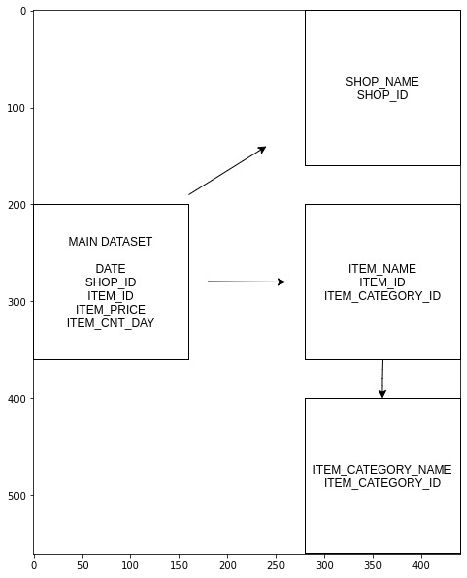

In [9]:
# Image of dataset scheme
import cv2
im = cv2.imread('Diagram.jpg')
plt.figure(figsize=(15,10))
plt.imshow(im)
plt.show()

## Preprocess

In [10]:
def load_data(data):
    print('----------------COLUMNS----------------\n')
    print(data.columns)
    print('-----------------SHAPE-----------------\n')
    print(data.shape)
    print('---------------DATA INFO---------------\n')
    print(data.info())
    print('---------------DATA NULLS--------------\n')
    total = data.isnull().sum().sort_values()
    percentage = (data.isnull().sum()/data.shape[0]*100).sort_values()
    missing_data = pd.concat([total, percentage], axis=1, keys=['Total', 'Percentage'])
    missing_data.sort_values(by=['Percentage'], inplace=True)
    print(missing_data)
    print('-------------UNIQUE VALUES-------------\n')
    for col in data:
          print(col + ': ' + str(data[col].nunique()))
    print('-------------DUPLICATES----------------\n')
    print(data.duplicated().sum())
   # print(data.drop(['item_category_id'], axis=1).duplicated().sum())

In [11]:
# Clean text
string.punctuation

re_punc = re.compile('[%s]' % re.escape(string.punctuation))
re_punc

def clean_text(name):
    tokens = re.split('\W+', name)
    words_clean = []
    for word in tokens:
        words_clean.append(re_punc.sub('', word.lower()))
    return(words_clean)

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

re.compile(r'[!"\#\$%\&\'\(\)\*\+,\-\./:;<=>\?@\[\\\]\^_`\{\|\}\~]',
re.UNICODE)

### Train data

In [12]:
load_data(train)

----------------COLUMNS----------------

Index(['date', 'date_block_num', 'shop_id', 'item_id', 'item_price',
       'item_cnt_day'],
      dtype='object')
-----------------SHAPE-----------------

(2935849, 6)
---------------DATA INFO---------------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2935849 entries, 0 to 2935848
Data columns (total 6 columns):
 #   Column          Dtype  
---  ------          -----  
 0   date            object 
 1   date_block_num  int64  
 2   shop_id         int64  
 3   item_id         int64  
 4   item_price      float64
 5   item_cnt_day    float64
dtypes: float64(2), int64(3), object(1)
memory usage: 134.4+ MB
None
---------------DATA NULLS--------------

                Total  Percentage
date                0         0.0
date_block_num      0         0.0
shop_id             0         0.0
item_id             0         0.0
item_price          0         0.0
item_cnt_day        0         0.0
-------------UNIQUE VALUES-------------

date: 1034
date_

In [13]:
# Drop duplicates
train.drop_duplicates(inplace=True)

In [14]:
# Check feature type and data
for col in train.columns:
    print(train[col].value_counts())

28.12.2013    9434
29.12.2013    9335
30.12.2014    9324
30.12.2013    9138
31.12.2014    8346
              ... 
14.05.2015    1174
28.04.2015    1154
06.10.2015    1152
13.05.2015    1128
12.05.2015    1123
Name: date, Length: 1034, dtype: int64
11    143246
23    130785
2     121347
0     115689
1     108613
7     104772
6     100548
5     100403
12     99349
10     96736
8      96137
9      94202
3      94109
14     92732
4      91759
13     89829
24     88522
19     86614
22     86428
17     82408
21     79361
18     78759
16     78528
15     77906
20     73157
25     71808
26     69977
31     57029
27     56274
30     55549
29     54617
28     54548
33     53514
32     50588
Name: date_block_num, dtype: int64
31    235636
25    186103
54    143479
28    142234
57    117428
42    109252
27    105366
6      82663
58     71441
56     69573
46     66321
50     65171
19     63911
15     59511
35     58445
21     58132
7      58076
47     56695
26     53910
18     53227
24     53032
53

**Classify features**<br/>
1. date - date when product is sold - change type to datetime
2. date_block_num - numbers for months from 0 to 33; 0 = January 2013, 33 = October 2015
3. shop_id - id of the shop where product is sold
4. item_id - id of sol item
5. item_price - unit product current price
6. item_cnt_day - number of products sold in a day

Categorical features - data_block_num, shop_id, item_id<br/>
Numerical features - item_price, item_cnt_day<br/>
Datetime - date

In [15]:
# Change date to datetime
train['date']=train['date'].apply(lambda x: datetime.strptime(x, "%d.%m.%Y"))

In [16]:
# Summary
train.describe()

,date_block_num,shop_id,item_id,item_price,item_cnt_day
count,2.935843e+06,2.935843e+06,2.935843e+06,2.935843e+06,2.935843e+06
mean,1.456991e+01,3.300171e+01,1.019723e+04,8.908535e+02,1.242641e+00
std,9.422992e+00,1.622698e+01,6.324293e+03,1.729801e+03,2.618837e+00
min,0.000000e+00,0.000000e+00,0.000000e+00,-1.000000e+00,-2.200000e+01
25%,7.000000e+00,2.200000e+01,4.476000e+03,2.490000e+02,1.000000e+00
50%,1.400000e+01,3.100000e+01,9.343000e+03,3.990000e+02,1.000000e+00
75%,2.300000e+01,4.700000e+01,1.568400e+04,9.990000e+02,1.000000e+00
max,3.300000e+01,5.900000e+01,2.216900e+04,3.079800e+05,2.169000e+03


Item price and item count per day have negative values as a minimum. To se values need to be checked.<br/>
Date block number has range from 0 to 33 as specified in the data documentation. 

### Test data

In [17]:
load_data(test)

----------------COLUMNS----------------

Index(['ID', 'shop_id', 'item_id'], dtype='object')
-----------------SHAPE-----------------

(214200, 3)
---------------DATA INFO---------------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 214200 entries, 0 to 214199
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype
---  ------   --------------   -----
 0   ID       214200 non-null  int64
 1   shop_id  214200 non-null  int64
 2   item_id  214200 non-null  int64
dtypes: int64(3)
memory usage: 4.9 MB
None
---------------DATA NULLS--------------

         Total  Percentage
ID           0         0.0
shop_id      0         0.0
item_id      0         0.0
-------------UNIQUE VALUES-------------

ID: 214200
shop_id: 42
item_id: 5100
-------------DUPLICATES----------------

0


In [18]:
# Check duplicates if ID is removed
test.drop('ID', axis=1).duplicated().sum()

0

In [19]:
# Check feature type and data
for col in test.columns:
    print(test[col].value_counts())

2047      1
105062    1
64074     1
57929     1
59976     1
         ..
103832    1
126359    1
124310    1
130453    1
0         1
Name: ID, Length: 214200, dtype: int64
59    5100
16    5100
28    5100
26    5100
25    5100
24    5100
22    5100
21    5100
19    5100
18    5100
15    5100
58    5100
14    5100
12    5100
10    5100
7     5100
6     5100
5     5100
4     5100
3     5100
31    5100
34    5100
35    5100
36    5100
57    5100
56    5100
55    5100
53    5100
52    5100
50    5100
49    5100
48    5100
47    5100
46    5100
45    5100
44    5100
42    5100
41    5100
39    5100
38    5100
37    5100
2     5100
Name: shop_id, dtype: int64
2047     42
19744    42
15406    42
13359    42
3240     42
         ..
21086    42
21214    42
17244    42
21342    42
2049     42
Name: item_id, Length: 5100, dtype: int64


In [20]:
test.describe()

,ID,shop_id,item_id
count,214200.000000,214200.000000,214200.000000
mean,107099.500000,31.642857,11019.398627
std,61834.358168,17.561933,6252.644590
min,0.000000,2.000000,30.000000
25%,53549.750000,16.000000,5381.500000
50%,107099.500000,34.500000,11203.000000
75%,160649.250000,47.000000,16071.500000
max,214199.000000,59.000000,22167.000000


Values of test data set look correct. Since they are shop and item id we can notice that there are no negative values and no duplicates. Data set has no nulls.

### Shops data set

In [21]:
shops

,shop_name,shop_id
0,"!Якутск Орджоникидзе, 56 фран",0
1,"!Якутск ТЦ ""Центральный"" фран",1
2,"Адыгея ТЦ ""Мега""",2
3,"Балашиха ТРК ""Октябрь-Киномир""",3
4,"Волжский ТЦ ""Волга Молл""",4
5,"Вологда ТРЦ ""Мармелад""",5
6,"Воронеж (Плехановская, 13)",6
7,"Воронеж ТРЦ ""Максимир""",7
8,"Воронеж ТРЦ Сити-Парк ""Град""",8
9,Выездная Торговля,9


In [22]:
load_data(shops)

----------------COLUMNS----------------

Index(['shop_name', 'shop_id'], dtype='object')
-----------------SHAPE-----------------

(60, 2)
---------------DATA INFO---------------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60 entries, 0 to 59
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   shop_name  60 non-null     object
 1   shop_id    60 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 1.1+ KB
None
---------------DATA NULLS--------------

           Total  Percentage
shop_name      0         0.0
shop_id        0         0.0
-------------UNIQUE VALUES-------------

shop_name: 60
shop_id: 60
-------------DUPLICATES----------------

0


In [23]:
shops['shop_name_clean']=shops['shop_name'].apply(lambda x : " ".join(clean_text(x)).strip())

In [24]:
# Check duplicates if shop_id is removed
shops.drop(['shop_id', 'shop_name'], axis=1).duplicated().sum()

0

In [25]:
shops

,shop_name,shop_id,shop_name_clean
0,"!Якутск Орджоникидзе, 56 фран",0,якутск орджоникидзе 56 фран
1,"!Якутск ТЦ ""Центральный"" фран",1,якутск тц центральный фран
2,"Адыгея ТЦ ""Мега""",2,адыгея тц мега
3,"Балашиха ТРК ""Октябрь-Киномир""",3,балашиха трк октябрь киномир
4,"Волжский ТЦ ""Волга Молл""",4,волжский тц волга молл
5,"Вологда ТРЦ ""Мармелад""",5,вологда трц мармелад
6,"Воронеж (Плехановская, 13)",6,воронеж плехановская 13
7,"Воронеж ТРЦ ""Максимир""",7,воронеж трц максимир
8,"Воронеж ТРЦ Сити-Парк ""Град""",8,воронеж трц сити парк град
9,Выездная Торговля,9,выездная торговля


After cleaning the data still there are no duplicated values. Inspecting visuali shops table we can notice that:
1. shop id 10 and 11 have the same name
3. shop id 0 and shop id 57 have the same name 
4. shop id 1 and shop id 58 have the same name
5. shop id 39 and 40 cound be the same as well

Dataset has no nulls but there are 8 stores with very similar name.

#### Check if duplicated stores are the same

In [26]:
train[train['shop_id']==10]['date_block_num'].value_counts().index.sort_values()
train[train['shop_id']==11]['date_block_num'].value_counts().index.sort_values()

Int64Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
            17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33],
           dtype='int64')

Int64Index([25], dtype='int64')

In [27]:
train[train['shop_id']==0]['date_block_num'].value_counts().index.sort_values()
train[train['shop_id']==57]['date_block_num'].value_counts().index.sort_values()

Int64Index([0, 1], dtype='int64')

Int64Index([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
            19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33],
           dtype='int64')

In [28]:
train[train['shop_id']==1]['date_block_num'].value_counts().index.sort_values()
train[train['shop_id']==58]['date_block_num'].value_counts().index.sort_values()

Int64Index([0, 1], dtype='int64')

Int64Index([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
            19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33],
           dtype='int64')

In [29]:
train[train['shop_id']==39]['date_block_num'].value_counts().index.sort_values()
train[train['shop_id']==40]['date_block_num'].value_counts().index.sort_values()

Int64Index([14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30,
            31, 32, 33],
           dtype='int64')

Int64Index([14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24], dtype='int64')

In [30]:
train[(train['shop_id']==39) & (train['date_block_num']==14)]
train[(train['shop_id']==40) & (train['date_block_num']==14)]

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day
1530388,2014-03-02,14,39,1324,499.0,1.0
1530389,2014-03-23,14,39,1305,299.0,1.0
1530390,2014-03-30,14,39,1303,299.0,1.0
1530391,2014-03-11,14,39,1202,1599.0,1.0
1530392,2014-03-06,14,39,1201,299.0,1.0
...,...,...,...,...,...,...
1533622,2014-03-02,14,39,20949,5.0,2.0
1533623,2014-03-01,14,39,20949,5.0,1.0
1533624,2014-03-20,14,39,20249,299.0,1.0
1533625,2014-03-12,14,39,20949,5.0,1.0


,date,date_block_num,shop_id,item_id,item_price,item_cnt_day
1533149,2014-03-12,14,40,10376,399.0,1.0
1533150,2014-03-27,14,40,10098,749.0,1.0
1533151,2014-03-27,14,40,9863,699.0,1.0
1533152,2014-03-23,14,40,9862,399.0,1.0
1533153,2014-03-10,14,40,9862,399.0,2.0
...,...,...,...,...,...,...
1534071,2014-03-28,14,40,20949,5.0,1.0
1534072,2014-03-27,14,40,20949,5.0,3.0
1534073,2014-03-25,14,40,20949,5.0,3.0
1534074,2014-03-24,14,40,20949,5.0,1.0


Based on the months we can conclude that 10 and 11, 0 and 57, 1 and 58 are duplicated stores.

### Items dataset

In [31]:
load_data(items)

----------------COLUMNS----------------

Index(['item_name', 'item_id', 'item_category_id'], dtype='object')
-----------------SHAPE-----------------

(22170, 3)
---------------DATA INFO---------------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22170 entries, 0 to 22169
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   item_name         22170 non-null  object
 1   item_id           22170 non-null  int64 
 2   item_category_id  22170 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 519.7+ KB
None
---------------DATA NULLS--------------

                  Total  Percentage
item_name             0         0.0
item_id               0         0.0
item_category_id      0         0.0
-------------UNIQUE VALUES-------------

item_name: 22170
item_id: 22170
item_category_id: 84
-------------DUPLICATES----------------

0


In [32]:
items['items_name_clean']=items['item_name'].apply(lambda x : " ".join(clean_text(x)).strip())

In [33]:
# Check for duplicated items
items.drop(['item_id', 'item_category_id', 'item_name'], axis=1).duplicated().sum()

90

In [34]:
items[items['items_name_clean']=='call of duty ghosts ps4 русская версия']
items[items['items_name_clean']=='deep purple come hell or high water dvd']
items[items['items_name_clean']=='disney pixar вверх essentials psp русская версия']

,item_name,item_id,item_category_id,items_name_clean
2268,"Call of Duty. Ghosts [PS4, русская версия]",2268,20,call of duty ghosts ps4 русская версия
2331,"Call of Duty: Ghosts [PS4, русская версия]",2331,20,call of duty ghosts ps4 русская версия


,item_name,item_id,item_category_id,items_name_clean
2514,DEEP PURPLE Come Hell Or High Water DVD,2514,59,deep purple come hell or high water dvd
2558,DEEP PURPLE Come Hell Or High Water DVD,2558,59,deep purple come hell or high water dvd


,item_name,item_id,item_category_id,items_name_clean
2845,"Disney / Pixar Вверх! (Essentials) [PSP, русск...",2845,21,disney pixar вверх essentials psp русская версия
2953,"Disney/Pixar. Вверх! (Essentials) [PSP, русска...",2953,21,disney pixar вверх essentials psp русская версия


In [35]:
# Check if duplicated items have same category
items_same_name=items[items.drop(['item_id', 'item_category_id', 'item_name'], axis=1).duplicated()]['items_name_clean'].to_list()
items_same_name_id=items[items.drop(['item_id', 'item_category_id', 'item_name'], axis=1).duplicated()]['item_id'].to_list()

for item, item_id in zip(items_same_name, items_same_name_id):
    value_1=items[(items['items_name_clean']==item) & (items['item_id']==item_id)]['item_category_id'].iloc[0]
    value_2=items[(items['items_name_clean']==item) & (items['item_id']!=item_id)]['item_category_id'].iloc[0]       
    if value_1!=value_2:
        print(item, item_id)

Duplicated items are in the same category.

In [36]:
items.describe()

,item_id,item_category_id
count,22170.00000,22170.000000
mean,11084.50000,46.290753
std,6400.07207,15.941486
min,0.00000,0.000000
25%,5542.25000,37.000000
50%,11084.50000,40.000000
75%,16626.75000,58.000000
max,22169.00000,83.000000


There are 84 item categories. Data set has no nulls but it has 90 duplicated items.

### Items category

In [37]:
load_data(item_categories)

----------------COLUMNS----------------

Index(['item_category_name', 'item_category_id'], dtype='object')
-----------------SHAPE-----------------

(84, 2)
---------------DATA INFO---------------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84 entries, 0 to 83
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   item_category_name  84 non-null     object
 1   item_category_id    84 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 1.4+ KB
None
---------------DATA NULLS--------------

                    Total  Percentage
item_category_name      0         0.0
item_category_id        0         0.0
-------------UNIQUE VALUES-------------

item_category_name: 84
item_category_id: 84
-------------DUPLICATES----------------

0


In [38]:
item_categories.describe()

,item_category_id
count,84.000000
mean,41.500000
std,24.392622
min,0.000000
25%,20.750000
50%,41.500000
75%,62.250000
max,83.000000


In [39]:
# Clean category name
item_categories['item_category_name_clean']=item_categories['item_category_name'].apply(lambda x : " ".join(clean_text(x)).strip())

In [40]:
# Check duplicates after removing ids
item_categories.drop(['item_category_name', 'item_category_id'], axis=1).duplicated().sum()

0

In [41]:
item_categories['item_category_name'].to_list()

['PC - Гарнитуры/Наушники',
 'Аксессуары - PS2',
 'Аксессуары - PS3',
 'Аксессуары - PS4',
 'Аксессуары - PSP',
 'Аксессуары - PSVita',
 'Аксессуары - XBOX 360',
 'Аксессуары - XBOX ONE',
 'Билеты (Цифра)',
 'Доставка товара',
 'Игровые консоли - PS2',
 'Игровые консоли - PS3',
 'Игровые консоли - PS4',
 'Игровые консоли - PSP',
 'Игровые консоли - PSVita',
 'Игровые консоли - XBOX 360',
 'Игровые консоли - XBOX ONE',
 'Игровые консоли - Прочие',
 'Игры - PS2',
 'Игры - PS3',
 'Игры - PS4',
 'Игры - PSP',
 'Игры - PSVita',
 'Игры - XBOX 360',
 'Игры - XBOX ONE',
 'Игры - Аксессуары для игр',
 'Игры Android - Цифра',
 'Игры MAC - Цифра',
 'Игры PC - Дополнительные издания',
 'Игры PC - Коллекционные издания',
 'Игры PC - Стандартные издания',
 'Игры PC - Цифра',
 'Карты оплаты (Кино, Музыка, Игры)',
 'Карты оплаты - Live!',
 'Карты оплаты - Live! (Цифра)',
 'Карты оплаты - PSN',
 'Карты оплаты - Windows (Цифра)',
 'Кино - Blu-Ray',
 'Кино - Blu-Ray 3D',
 'Кино - Blu-Ray 4K',
 'Кино - DV

#### Check if some of the categories are duplicated

In [42]:
item_categories[item_categories['item_category_name']=='Карты оплаты - Live! (Цифра)']['item_category_id']
item_categories[item_categories['item_category_name']=='Карты оплаты - Live!']['item_category_id']
item_categories[item_categories['item_category_name']=='Книги - Аудиокниги']['item_category_id']
item_categories[item_categories['item_category_name']=='Книги - Аудиокниги (Цифра)']['item_category_id']
item_categories[item_categories['item_category_name']=='Подарки - Настольные игры']['item_category_id']
item_categories[item_categories['item_category_name']=='Подарки - Настольные игры (компактные)']['item_category_id']
item_categories[item_categories['item_category_name']=='Программы - Для дома и офиса']['item_category_id']
item_categories[item_categories['item_category_name']=='Программы - Для дома и офиса (Цифра)']['item_category_id']

34    34
Name: item_category_id, dtype: int64

33    33
Name: item_category_id, dtype: int64

43    43
Name: item_category_id, dtype: int64

44    44
Name: item_category_id, dtype: int64

64    64
Name: item_category_id, dtype: int64

65    65
Name: item_category_id, dtype: int64

75    75
Name: item_category_id, dtype: int64

76    76
Name: item_category_id, dtype: int64

In [43]:
# Checnk of categories have the same items
items[items['item_category_id']==34]['item_id'].equals(items[items['item_category_id']==33]['item_id'])
items[items['item_category_id']==43]['item_id'].equals(items[items['item_category_id']==44]['item_id'])
items[items['item_category_id']==64]['item_id'].equals(items[items['item_category_id']==65]['item_id'])
items[items['item_category_id']==75]['item_id'].equals(items[items['item_category_id']==76]['item_id'])

False

False

False

False

Based on the items in each category, we can conclude that these categories are different. <br/>
There are 84 categories, no nulls and no duplicated values.

## Exploratory data analysis

In [44]:
# Merge all data set into one big dataset
new_train = pd.merge(train, items, on='item_id')
new_train = pd.merge(new_train, shops, on='shop_id')
new_train = pd.merge(new_train, item_categories, on ='item_category_id')
new_train

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean
0,2013-01-02,0,59,22154,999.0,1.0,ЯВЛЕНИЕ 2012 (BD),37,явление 2012 bd,"Ярославль ТЦ ""Альтаир""",ярославль тц альтаир,Кино - Blu-Ray,кино blu ray
1,2013-04-26,3,59,944,150.0,1.0,2012 (BD),37,2012 bd,"Ярославль ТЦ ""Альтаир""",ярославль тц альтаир,Кино - Blu-Ray,кино blu ray
2,2013-06-26,5,59,944,199.5,1.0,2012 (BD),37,2012 bd,"Ярославль ТЦ ""Альтаир""",ярославль тц альтаир,Кино - Blu-Ray,кино blu ray
3,2013-07-20,6,59,944,199.5,1.0,2012 (BD),37,2012 bd,"Ярославль ТЦ ""Альтаир""",ярославль тц альтаир,Кино - Blu-Ray,кино blu ray
4,2013-09-14,8,59,944,299.0,2.0,2012 (BD),37,2012 bd,"Ярославль ТЦ ""Альтаир""",ярославль тц альтаир,Кино - Blu-Ray,кино blu ray
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2935838,2015-10-22,33,55,13093,250.0,1.0,Карта оплаты Windows: 250 рублей [Цифровая вер...,36,карта оплаты windows 250 рублей цифровая версия,Цифровой склад 1С-Онлайн,цифровой склад 1с онлайн,Карты оплаты - Windows (Цифра),карты оплаты windows цифра
2935839,2015-09-21,32,55,13091,1000.0,1.0,Карта оплаты Windows: 1000 рублей [Цифровая ве...,36,карта оплаты windows 1000 рублей цифровая версия,Цифровой склад 1С-Онлайн,цифровой склад 1с онлайн,Карты оплаты - Windows (Цифра),карты оплаты windows цифра
2935840,2015-09-16,32,55,13094,2500.0,1.0,Карта оплаты Windows: 2500 рублей [Цифровая ве...,36,карта оплаты windows 2500 рублей цифровая версия,Цифровой склад 1С-Онлайн,цифровой склад 1с онлайн,Карты оплаты - Windows (Цифра),карты оплаты windows цифра
2935841,2015-09-22,32,55,13094,2500.0,2.0,Карта оплаты Windows: 2500 рублей [Цифровая ве...,36,карта оплаты windows 2500 рублей цифровая версия,Цифровой склад 1С-Онлайн,цифровой склад 1с онлайн,Карты оплаты - Windows (Цифра),карты оплаты windows цифра


In [45]:
# Remove duplicated stores by merging stores with same name under the same id
new_train.loc[new_train.shop_id == 0, 'shop_id']=57
new_train.loc[new_train.shop_id == 10, 'shop_id']=11
new_train.loc[new_train.shop_id == 1, 'shop_id']=58

In [46]:
new_train.loc[new_train.shop_name == '!Якутск Орджоникидзе, 56 фран', 'shop_name']='Якутск Орджоникидзе, 56'
new_train.loc[new_train.shop_name == 'Жуковский ул. Чкалова 39м?', 'shop_name']='Жуковский ул. Чкалова 39м²'
new_train.loc[new_train.shop_name == '!Якутск ТЦ "Центральный" фран', 'shop_name']='Якутск ТЦ "Центральный"'

In [47]:
# Merge duplicated items
items_same_name=items[items.drop(['item_id', 'item_category_id', 'item_name'], axis=1).duplicated()]['items_name_clean'].to_list()
items_same_name_id=items[items.drop(['item_id', 'item_category_id', 'item_name'], axis=1).duplicated()]['item_id'].to_list()

for item, item_id in zip(items_same_name, items_same_name_id):
    if item_id==10373 or item_id==12811:
        continue
    value=new_train[(new_train['items_name_clean']==item) & (new_train['item_id']!=item_id)]['item_id'].iloc[0]       
    new_train.loc[new_train.item_id == item_id, 'item_id']=value

### Check the number of items per category

In [48]:
# Count number of items each category has
category_items = new_train.groupby('item_category_id')['item_id'].nunique().to_frame().reset_index().sort_values('item_id',ascending=False)
category_items

,item_category_id,item_id
40,40,4892
55,55,2326
37,37,1770
31,31,1097
58,58,768
...,...,...
1,1,2
50,50,2
10,10,1
79,79,1


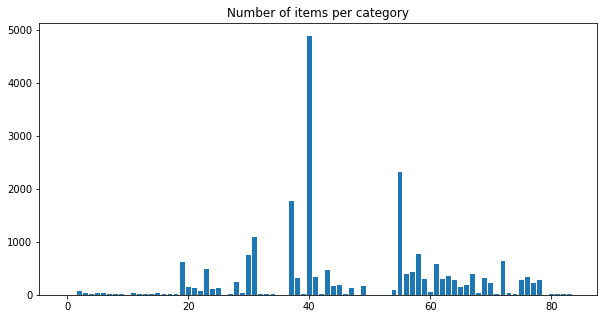

In [49]:
# Plot the number of items each category has
_ = plt.figure(figsize=(10,5))
_ = plt.bar(x='item_category_id', height='item_id', data=category_items)
_ = plt.title('Number of items per category')

Item category with id 40 has the most number of items, followed by cataegory with id 55 which has 2365 items. <br/>
There are also categories with less than 10 items.

In [50]:
# Category with the biggest amount of items
item_categories[item_categories['item_category_id']==40]
item_categories[item_categories['item_category_id']==55]

,item_category_name,item_category_id,item_category_name_clean
40,Кино - DVD,40,кино dvd


,item_category_name,item_category_id,item_category_name_clean
55,Музыка - CD локального производства,55,музыка cd локального производства


Two categories with most items are categories related to DVD and CD.

In [51]:
# Categories with least amount of items
item_categories[item_categories['item_category_id']==51]
item_categories[item_categories['item_category_id']==79]

,item_category_name,item_category_id,item_category_name_clean
51,Книги - Познавательная литература,51,книги познавательная литература


,item_category_name,item_category_id,item_category_name_clean
79,Служебные,79,служебные


### Check negative item_price

In [52]:
# Check the item with negative price
new_train[new_train['item_price']<=0]

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean
872641,2013-05-15,4,32,2973,-1.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТЦ ""Серебряный Дом""",москва тц серебряный дом,Игры - PS3,игры ps3


In [53]:
# Check prices for the same item
new_train[new_train['item_id']==2973].sort_values('item_price', ascending=True).head(10)

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean
872641,2013-05-15,4,32,2973,-1.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТЦ ""Серебряный Дом""",москва тц серебряный дом,Игры - PS3,игры ps3
694877,2013-06-14,5,25,2973,1049.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТРК ""Атриум""",москва трк атриум,Игры - PS3,игры ps3
694895,2014-06-06,17,25,2973,1248.7,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТРК ""Атриум""",москва трк атриум,Игры - PS3,игры ps3
764200,2013-06-17,5,16,2973,1248.9,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Коломна ТЦ ""Рио""",коломна тц рио,Игры - PS3,игры ps3
804461,2013-06-14,5,21,2973,1249.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва МТРЦ ""Афи Молл""",москва мтрц афи молл,Игры - PS3,игры ps3
828146,2013-06-18,5,18,2973,1249.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Красноярск ТЦ ""Июнь""",красноярск тц июнь,Игры - PS3,игры ps3
745824,2014-03-12,14,38,2973,1249.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Омск ТЦ ""Мега""",омск тц мега,Игры - PS3,игры ps3
828154,2014-03-17,14,18,2973,1249.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Красноярск ТЦ ""Июнь""",красноярск тц июнь,Игры - PS3,игры ps3
694892,2014-02-22,13,25,2973,1249.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТРК ""Атриум""",москва трк атриум,Игры - PS3,игры ps3
694893,2014-03-04,14,25,2973,1249.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТРК ""Атриум""",москва трк атриум,Игры - PS3,игры ps3


Item 2973 has price that ranges from 1000 to 2500. Only on one day for one store that price was less than 0.

In [54]:
# Check the same store, date and shop id to see if this price is a mistake
new_train[(new_train['shop_id']==32) & (new_train['item_id']==2973)].sort_values('date')

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean
872637,2013-01-15,0,32,2973,2499.0,3.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТЦ ""Серебряный Дом""",москва тц серебряный дом,Игры - PS3,игры ps3
872636,2013-01-17,0,32,2973,2499.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТЦ ""Серебряный Дом""",москва тц серебряный дом,Игры - PS3,игры ps3
872635,2013-01-18,0,32,2973,2499.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТЦ ""Серебряный Дом""",москва тц серебряный дом,Игры - PS3,игры ps3
872634,2013-01-21,0,32,2973,2499.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТЦ ""Серебряный Дом""",москва тц серебряный дом,Игры - PS3,игры ps3
872633,2013-01-22,0,32,2973,2499.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТЦ ""Серебряный Дом""",москва тц серебряный дом,Игры - PS3,игры ps3
872632,2013-01-25,0,32,2973,2499.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТЦ ""Серебряный Дом""",москва тц серебряный дом,Игры - PS3,игры ps3
872631,2013-01-29,0,32,2973,2499.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТЦ ""Серебряный Дом""",москва тц серебряный дом,Игры - PS3,игры ps3
872638,2013-02-05,1,32,2973,2499.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТЦ ""Серебряный Дом""",москва тц серебряный дом,Игры - PS3,игры ps3
872639,2013-02-14,1,32,2973,2499.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТЦ ""Серебряный Дом""",москва тц серебряный дом,Игры - PS3,игры ps3
872642,2013-05-06,4,32,2973,2499.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТЦ ""Серебряный Дом""",москва тц серебряный дом,Игры - PS3,игры ps3


In [55]:
# Check the price of the item for the same date
new_train[(new_train['date']=='2013-05-15') & (new_train['item_id']==2973)].sort_values('item_price')

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean
872641,2013-05-15,4,32,2973,-1.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТЦ ""Серебряный Дом""",москва тц серебряный дом,Игры - PS3,игры ps3
869920,2013-05-15,4,45,2973,1249.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Самара ТЦ ""ПаркХаус""",самара тц паркхаус,Игры - PS3,игры ps3
694870,2013-05-15,4,25,2973,1249.5,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТРК ""Атриум""",москва трк атриум,Игры - PS3,игры ps3
754396,2013-05-15,4,46,2973,1249.5,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Сергиев Посад ТЦ ""7Я""",сергиев посад тц 7я,Игры - PS3,игры ps3


In [56]:
# Check prices on that day
new_train[(new_train['date']=='2013-05-15')].sort_values('item_price').head(10)

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean
872641,2013-05-15,4,32,2973,-1.0,1.0,"DmC Devil May Cry [PS3, русские субтитры]",19,dmc devil may cry ps3 русские субтитры,"Москва ТЦ ""Серебряный Дом""",москва тц серебряный дом,Игры - PS3,игры ps3
2764380,2013-05-15,4,13,20949,3.0,1.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Казань ТЦ ""Бехетле""",казань тц бехетле,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши
2747320,2013-05-15,4,51,20949,3.0,4.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Тюмень ТЦ ""Зеленый Берег""",тюмень тц зеленый берег,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши
2752574,2013-05-15,4,47,20949,5.0,5.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Сургут ТРЦ ""Сити Молл""",сургут трц сити молл,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши
2747801,2013-05-15,4,16,20949,5.0,3.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Коломна ТЦ ""Рио""",коломна тц рио,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши
2746031,2013-05-15,4,46,20949,5.0,8.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Сергиев Посад ТЦ ""7Я""",сергиев посад тц 7я,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши
2745254,2013-05-15,4,37,20949,5.0,1.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Новосибирск ТЦ ""Мега""",новосибирск тц мега,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши
2743846,2013-05-15,4,42,20949,5.0,3.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"СПб ТК ""Невский Центр""",спб тк невский центр,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши
2753206,2013-05-15,4,21,20949,5.0,1.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Москва МТРЦ ""Афи Молл""",москва мтрц афи молл,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши
2743211,2013-05-15,4,54,20949,5.0,9.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Химки ТЦ ""Мега""",химки тц мега,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши


Looking at the data it could be noticed that negative price of item 2973 appears just once. For that reason entry will be removed.

In [57]:
new_train.shape

(2935843, 13)

In [58]:
# Remove negative price
new_train=new_train[new_train['item_price']!=-1]
new_train.shape

(2935842, 13)

### Check negative item_cnt_day

In [59]:
# Check negative item count per day
new_train[new_train['item_cnt_day']<=0].sort_values('item_cnt_day')

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean
2390807,2013-11-02,10,12,8023,15.000000,-22.0,ZL004 Лазерные наклейки Смайлики маленькие,66,zl004 лазерные наклейки смайлики маленькие,Интернет-магазин ЧС,интернет магазин чс,"Подарки - Открытки, наклейки",подарки открытки наклейки
2758677,2014-07-10,18,14,20949,5.000000,-16.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Казань ТЦ ""ПаркХаус"" II",казань тц паркхаус ii,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши
2861816,2014-10-10,21,12,9242,1433.333333,-9.0,"Билет ""ИгроМир 2014"" (на один день (отдельно -...",8,билет игромир 2014 на один день отдельно 4 5 о...,Интернет-магазин ЧС,интернет магазин чс,Билеты (Цифра),билеты цифра
742903,2013-10-19,9,42,3732,2599.000000,-6.0,"Grand Theft Auto V [PS3, русские субтитры]",19,grand theft auto v ps3 русские субтитры,"СПб ТК ""Невский Центр""",спб тк невский центр,Игры - PS3,игры ps3
2017045,2013-01-18,0,12,1590,2599.000000,-6.0,"Assassin’s Creed 3. Freedom Edition [PC, русск...",29,assassin s creed 3 freedom edition pc русская ...,Интернет-магазин ЧС,интернет магазин чс,Игры PC - Коллекционные издания,игры pc коллекционные издания
...,...,...,...,...,...,...,...,...,...,...,...,...,...
849850,2013-06-06,5,12,3938,1999.000000,-1.0,"Injustice: Gods Among Us. Soviet Edition [PS3,...",19,injustice gods among us soviet edition ps3 рус...,Интернет-магазин ЧС,интернет магазин чс,Игры - PS3,игры ps3
849760,2015-09-02,32,12,7071,999.000000,-1.0,"Tomb Raider [PS3, русская версия]",19,tomb raider ps3 русская версия,Интернет-магазин ЧС,интернет магазин чс,Игры - PS3,игры ps3
849739,2013-04-17,3,12,7071,2499.000000,-1.0,"Tomb Raider [PS3, русская версия]",19,tomb raider ps3 русская версия,Интернет-магазин ЧС,интернет магазин чс,Игры - PS3,игры ps3
849707,2013-08-08,7,12,3738,299.000000,-1.0,Grand Theft Auto V. Комплект предварительного ...,19,grand theft auto v комплект предварительного з...,Интернет-магазин ЧС,интернет магазин чс,Игры - PS3,игры ps3


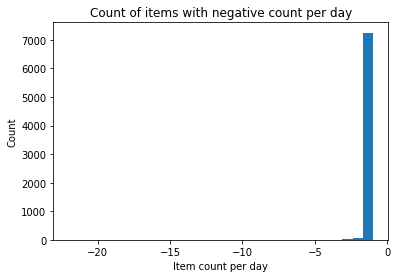

In [60]:
# Distribution of items with negative count
_ = plt.hist(new_train[new_train['item_cnt_day']<=0]['item_cnt_day'], bins=30)
_ = plt.xlabel('Item count per day')
_ = plt.ylabel('Count')
_ = plt.title('Count of items with negative count per day')

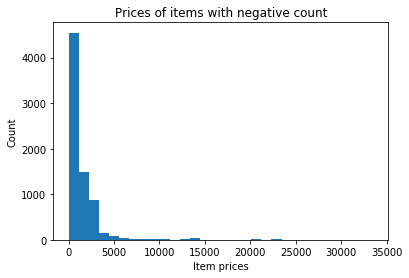

In [61]:
# Price of items with negative count
_ = plt.hist(new_train[new_train['item_cnt_day']<=0]['item_price'], bins=30)
_ = plt.xlabel('Item prices')
_ = plt.ylabel('Count')
_ = plt.title('Prices of items with negative count')

Most of the items with negative count have count of -1. The biggest negative count in a day is -22.<br/>

In [62]:
# Check if the negative and positive orders are made in the same month
new_train[(new_train['shop_id']==12) & (new_train['item_id']==8023)]

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean
2390805,2013-05-31,4,12,8023,20.0,1.0,ZL004 Лазерные наклейки Смайлики маленькие,66,zl004 лазерные наклейки смайлики маленькие,Интернет-магазин ЧС,интернет магазин чс,"Подарки - Открытки, наклейки",подарки открытки наклейки
2390806,2013-09-25,8,12,8023,15.0,22.0,ZL004 Лазерные наклейки Смайлики маленькие,66,zl004 лазерные наклейки смайлики маленькие,Интернет-магазин ЧС,интернет магазин чс,"Подарки - Открытки, наклейки",подарки открытки наклейки
2390807,2013-11-02,10,12,8023,15.0,-22.0,ZL004 Лазерные наклейки Смайлики маленькие,66,zl004 лазерные наклейки смайлики маленькие,Интернет-магазин ЧС,интернет магазин чс,"Подарки - Открытки, наклейки",подарки открытки наклейки
2390808,2013-12-27,11,12,8023,15.0,1.0,ZL004 Лазерные наклейки Смайлики маленькие,66,zl004 лазерные наклейки смайлики маленькие,Интернет-магазин ЧС,интернет магазин чс,"Подарки - Открытки, наклейки",подарки открытки наклейки
2390809,2014-01-27,12,12,8023,15.0,20.0,ZL004 Лазерные наклейки Смайлики маленькие,66,zl004 лазерные наклейки смайлики маленькие,Интернет-магазин ЧС,интернет магазин чс,"Подарки - Открытки, наклейки",подарки открытки наклейки


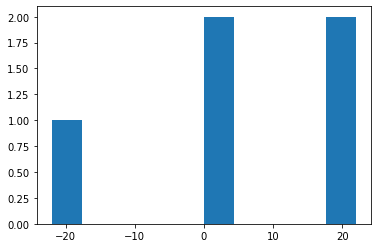

In [63]:
_=plt.hist(new_train[(new_train['shop_id']==12) & (new_train['item_id']==8023)]['item_cnt_day'])

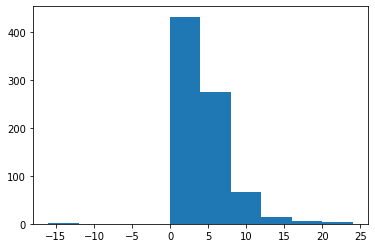

In [64]:
_=plt.hist(new_train[(new_train['shop_id']==14) & (new_train['item_id']==20949)]['item_cnt_day'])

In [65]:
new_train[(new_train['shop_id']==12) & (new_train['item_id']==1590)].sort_values('item_cnt_day')

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean
2017045,2013-01-18,0,12,1590,2599.0,-6.0,"Assassin’s Creed 3. Freedom Edition [PC, русск...",29,assassin s creed 3 freedom edition pc русская ...,Интернет-магазин ЧС,интернет магазин чс,Игры PC - Коллекционные издания,игры pc коллекционные издания
2017044,2013-01-10,0,12,1590,2599.0,-5.0,"Assassin’s Creed 3. Freedom Edition [PC, русск...",29,assassin s creed 3 freedom edition pc русская ...,Интернет-магазин ЧС,интернет магазин чс,Игры PC - Коллекционные издания,игры pc коллекционные издания
2017046,2013-01-23,0,12,1590,2599.0,-1.0,"Assassin’s Creed 3. Freedom Edition [PC, русск...",29,assassin s creed 3 freedom edition pc русская ...,Интернет-магазин ЧС,интернет магазин чс,Игры PC - Коллекционные издания,игры pc коллекционные издания
2017047,2013-01-29,0,12,1590,2599.0,-1.0,"Assassin’s Creed 3. Freedom Edition [PC, русск...",29,assassin s creed 3 freedom edition pc русская ...,Интернет-магазин ЧС,интернет магазин чс,Игры PC - Коллекционные издания,игры pc коллекционные издания
2017050,2013-08-08,7,12,1590,2599.0,-1.0,"Assassin’s Creed 3. Freedom Edition [PC, русск...",29,assassin s creed 3 freedom edition pc русская ...,Интернет-магазин ЧС,интернет магазин чс,Игры PC - Коллекционные издания,игры pc коллекционные издания
2017048,2013-02-16,1,12,1590,2599.0,1.0,"Assassin’s Creed 3. Freedom Edition [PC, русск...",29,assassin s creed 3 freedom edition pc русская ...,Интернет-магазин ЧС,интернет магазин чс,Игры PC - Коллекционные издания,игры pc коллекционные издания
2017049,2013-03-07,2,12,1590,2599.0,1.0,"Assassin’s Creed 3. Freedom Edition [PC, русск...",29,assassin s creed 3 freedom edition pc русская ...,Интернет-магазин ЧС,интернет магазин чс,Игры PC - Коллекционные издания,игры pc коллекционные издания


In [66]:
new_train[(new_train['shop_id']==12) & (new_train['item_id']==9242)].sort_values('item_cnt_day')

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean
2861816,2014-10-10,21,12,9242,1433.333333,-9.0,"Билет ""ИгроМир 2014"" (на один день (отдельно -...",8,билет игромир 2014 на один день отдельно 4 5 о...,Интернет-магазин ЧС,интернет магазин чс,Билеты (Цифра),билеты цифра
2861818,2015-10-13,33,12,9242,1500.000000,-1.0,"Билет ""ИгроМир 2014"" (на один день (отдельно -...",8,билет игромир 2014 на один день отдельно 4 5 о...,Интернет-магазин ЧС,интернет магазин чс,Билеты (Цифра),билеты цифра
2861817,2014-10-23,21,12,9242,900.000000,-1.0,"Билет ""ИгроМир 2014"" (на один день (отдельно -...",8,билет игромир 2014 на один день отдельно 4 5 о...,Интернет-магазин ЧС,интернет магазин чс,Билеты (Цифра),билеты цифра
2861783,2014-08-31,19,12,9242,900.000000,1.0,"Билет ""ИгроМир 2014"" (на один день (отдельно -...",8,билет игромир 2014 на один день отдельно 4 5 о...,Интернет-магазин ЧС,интернет магазин чс,Билеты (Цифра),билеты цифра
2861782,2014-08-29,19,12,9242,900.000000,1.0,"Билет ""ИгроМир 2014"" (на один день (отдельно -...",8,билет игромир 2014 на один день отдельно 4 5 о...,Интернет-магазин ЧС,интернет магазин чс,Билеты (Цифра),билеты цифра
2861781,2014-08-30,19,12,9242,900.000000,1.0,"Билет ""ИгроМир 2014"" (на один день (отдельно -...",8,билет игромир 2014 на один день отдельно 4 5 о...,Интернет-магазин ЧС,интернет магазин чс,Билеты (Цифра),билеты цифра
2861780,2014-08-21,19,12,9242,900.000000,1.0,"Билет ""ИгроМир 2014"" (на один день (отдельно -...",8,билет игромир 2014 на один день отдельно 4 5 о...,Интернет-магазин ЧС,интернет магазин чс,Билеты (Цифра),билеты цифра
2861772,2014-07-16,18,12,9242,900.000000,1.0,"Билет ""ИгроМир 2014"" (на один день (отдельно -...",8,билет игромир 2014 на один день отдельно 4 5 о...,Интернет-магазин ЧС,интернет магазин чс,Билеты (Цифра),билеты цифра
2861775,2014-07-22,18,12,9242,900.000000,1.0,"Билет ""ИгроМир 2014"" (на один день (отдельно -...",8,билет игромир 2014 на один день отдельно 4 5 о...,Интернет-магазин ЧС,интернет магазин чс,Билеты (Цифра),билеты цифра
2861779,2014-08-20,19,12,9242,900.000000,1.0,"Билет ""ИгроМир 2014"" (на один день (отдельно -...",8,билет игромир 2014 на один день отдельно 4 5 о...,Интернет-магазин ЧС,интернет магазин чс,Билеты (Цифра),билеты цифра


Inspecting negative values, nothing unusual is noticed. So this values could signify returns of a items in that day. It is not possible to conclude if the products are returned the same month or during some other month since we don't have info of the buyers.

In [67]:
# Number of stores where returns are made
new_train[new_train['item_cnt_day']<=0]['shop_id'].nunique()

54

There are 57 different shops and in 54 of them returns are observed.

In [68]:
# Which store has the most returns
store_product=new_train[new_train['item_cnt_day']<=0].groupby('shop_id').sum()['item_cnt_day'].sort_values().to_frame().reset_index()
store_product

,shop_id,item_cnt_day
0,12,-512.0
1,31,-453.0
2,54,-359.0
3,57,-317.0
4,25,-317.0
5,6,-268.0
6,42,-261.0
7,28,-220.0
8,43,-215.0
9,19,-213.0


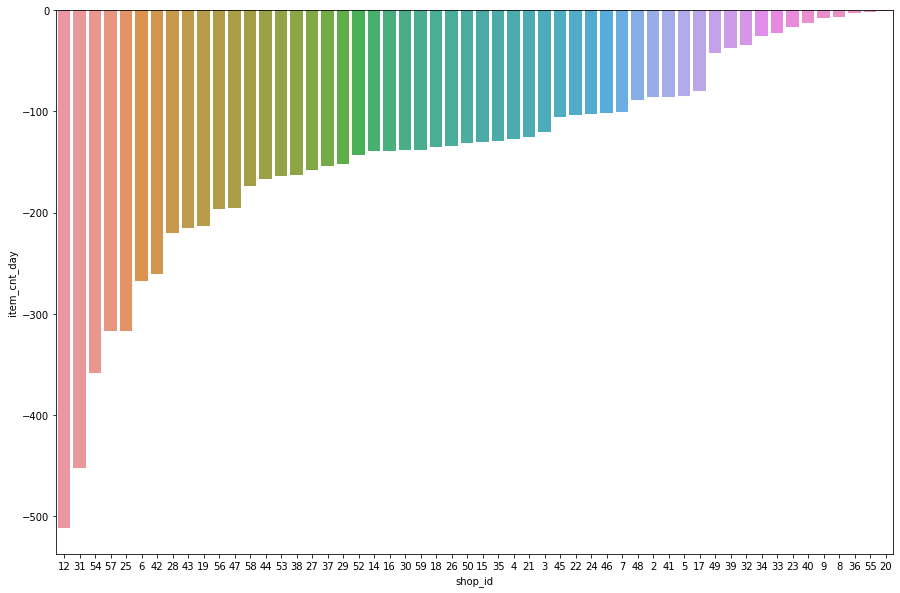

In [69]:
# Plot the stores with most returns
_ = plt.figure(figsize=(15,10))
_ = sns.barplot(x=store_product['shop_id'], y=store_product['item_cnt_day'], order=store_product.sort_values('item_cnt_day')['shop_id'])

In [70]:
# Shops with highest return
shops[shops['shop_id']==12]
shops[shops['shop_id']==31]
shops[shops['shop_id']==54]

,shop_name,shop_id,shop_name_clean
12,Интернет-магазин ЧС,12,интернет магазин чс


,shop_name,shop_id,shop_name_clean
31,"Москва ТЦ ""Семеновский""",31,москва тц семеновский


,shop_name,shop_id,shop_name_clean
54,"Химки ТЦ ""Мега""",54,химки тц мега


Store with the most returns is store with id 12. Looking at the name and internet search this store offers different magazines and also subscriptions. <br/>
Second two stores are shopping malls.

In [71]:
# Products that were returned
new_train[new_train['item_cnt_day']<=0].groupby('item_id').sum()['item_cnt_day'].sort_values()

item_id
2268    -65.0
3734    -45.0
3732    -34.0
1915    -33.0
5672    -31.0
         ... 
8965     -1.0
8974     -1.0
8982     -1.0
8913     -1.0
22167    -1.0
Name: item_cnt_day, Length: 3508, dtype: float64

There are 3508 different product that have negative count (probably returned products).

In [72]:
# Two most returned products
items[items['item_id']==2268]
items[items['item_id']==3734]

,item_name,item_id,item_category_id,items_name_clean
2268,"Call of Duty. Ghosts [PS4, русская версия]",2268,20,call of duty ghosts ps4 русская версия


,item_name,item_id,item_category_id,items_name_clean
3734,"Grand Theft Auto V [Xbox 360, русские субтитры]",3734,23,grand theft auto v xbox 360 русские субтитры


The most returned product is product with item id 2268.

In [73]:
# Category with the most returned products
new_train[new_train['item_cnt_day']<=0].groupby('item_category_id').sum()['item_cnt_day'].sort_values()

item_category_id
19   -870.0
30   -819.0
37   -747.0
40   -714.0
23   -633.0
55   -459.0
20   -444.0
28   -273.0
38   -223.0
21   -189.0
62   -171.0
41   -145.0
75   -140.0
3    -126.0
58   -100.0
24   -100.0
2     -99.0
72    -96.0
6     -91.0
22    -78.0
64    -74.0
29    -72.0
73    -69.0
57    -65.0
67    -53.0
61    -48.0
11    -44.0
25    -40.0
63    -40.0
12    -39.0
49    -38.0
7     -32.0
43    -31.0
69    -28.0
5     -27.0
65    -26.0
14    -25.0
66    -24.0
59    -23.0
60    -19.0
71    -18.0
35    -18.0
16    -15.0
56    -15.0
8     -15.0
15    -15.0
83    -15.0
17    -14.0
70    -13.0
4     -13.0
45    -12.0
77    -12.0
9      -8.0
33     -8.0
13     -7.0
47     -3.0
42     -2.0
31     -2.0
81     -1.0
80     -1.0
Name: item_cnt_day, dtype: float64

In [74]:
# Categories with most returns
item_categories[item_categories['item_category_id']==19]
item_categories[item_categories['item_category_id']==30]

,item_category_name,item_category_id,item_category_name_clean
19,Игры - PS3,19,игры ps3


,item_category_name,item_category_id,item_category_name_clean
30,Игры PC - Стандартные издания,30,игры pc стандартные издания


Games for Play Station 3 and games for PC are categories with most returned products.

In [75]:
# Months when products are most returned
new_train['month_year']=new_train['date'].apply(lambda x: x.strftime("%B, %Y"))
new_train[new_train['item_cnt_day']<=0].groupby('month_year').sum()['item_cnt_day'].sort_values()

month_year
January, 2013     -371.0
January, 2014     -344.0
January, 2015     -328.0
December, 2013    -328.0
December, 2014    -300.0
March, 2013       -296.0
August, 2013      -295.0
February, 2013    -292.0
February, 2014    -288.0
October, 2013     -274.0
November, 2013    -261.0
April, 2013       -249.0
July, 2014        -225.0
February, 2015    -221.0
September, 2014   -219.0
September, 2013   -219.0
March, 2015       -219.0
November, 2014    -205.0
March, 2014       -204.0
June, 2013        -202.0
October, 2014     -201.0
July, 2013        -199.0
June, 2014        -194.0
August, 2014      -189.0
April, 2014       -188.0
May, 2013         -178.0
May, 2014         -148.0
September, 2015   -146.0
May, 2015         -140.0
July, 2015        -129.0
October, 2015     -128.0
June, 2015        -123.0
April, 2015       -121.0
August, 2015      -117.0
Name: item_cnt_day, dtype: float64

In January and December most products are returned which could match with New Year's shopping.

### Items

In [76]:
new_train['item_id'].nunique()

21719

In [77]:
# Most sold product
sold_quantities = new_train.groupby('item_id').sum().reset_index().sort_values('item_cnt_day', ascending=False)
sold_quantities

,item_id,date_block_num,shop_id,item_price,item_cnt_day,item_category_id
20517,20949,554196,991886,1.540316e+05,187642.0,2225140
2747,2808,87656,231659,7.475887e+06,17245.0,224370
3650,3732,96917,202041,1.756505e+07,16642.0,123025
17351,17717,203956,273979,9.924972e+06,15830.0,716293
5711,5822,158305,297668,9.984311e+06,14515.0,329280
...,...,...,...,...,...,...
8340,8515,0,46,2.831000e+02,0.0,154
13171,13474,7,42,1.039800e+04,-1.0,11
11618,11871,0,16,5.999000e+03,-1.0,62
17693,18062,1,16,4.999000e+03,-1.0,62


In [78]:
items[items['item_id']==20949]

,item_name,item_id,item_category_id,items_name_clean
20949,Фирменный пакет майка 1С Интерес белый (34*42)...,20949,71,фирменный пакет майка 1с интерес белый 34 42 4...


There are 21719 different items. The most sold product has id 20949. This product is 10 times more sold than 2808 which is second most sold product. <br/>
There are products that have negative sale, or products that are more sold than retured. <br/>

In [79]:
# Product with no sales
sold_quantities[sold_quantities['item_cnt_day']<=0]

,item_id,date_block_num,shop_id,item_price,item_cnt_day,item_category_id
13174,13477,13,61,20388.0,0.0,22
4499,4591,20,62,798.0,0.0,118
7395,7547,36,108,6780.0,0.0,150
8340,8515,0,46,283.1,0.0,154
13171,13474,7,42,10398.0,-1.0,11
11618,11871,0,16,5999.0,-1.0,62
17693,18062,1,16,4999.0,-1.0,62
1552,1590,10,92,20792.0,-11.0,232


There are 8 products with no sales.

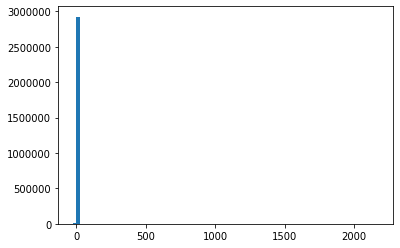

In [80]:
# Distribution of item count per day
_ = plt.hist(new_train['item_cnt_day'], bins=100)

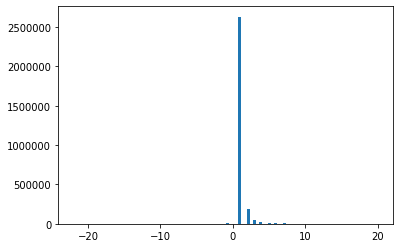

In [81]:
# Magnified sales
_ = plt.hist(new_train[new_train['item_cnt_day']<=20]['item_cnt_day'], bins=100)

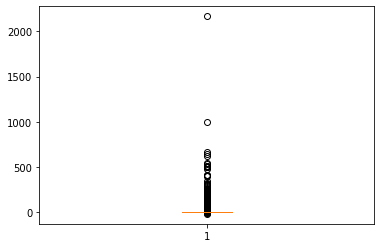

In [82]:
# Distribution of item count per day
_ = plt.boxplot(new_train['item_cnt_day'])

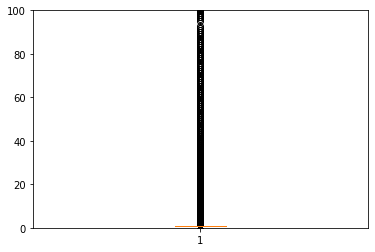

In [83]:
# Magnified distribution of item count per day
_ = plt.boxplot(new_train['item_cnt_day'])
_ = plt.ylim(0,100)

In [84]:
new_train['item_cnt_day'].value_counts()

1.0      2629365
2.0       194201
3.0        47350
4.0        19685
5.0        10474
          ...   
179.0          1
187.0          1
194.0          1
195.0          1
508.0          1
Name: item_cnt_day, Length: 198, dtype: int64

When we look how much is product sold per day, we can notice that most of the products are sold in quantites less than 10. There are some number of products that are sold in large quantites, the biggest observed is 2169. <br/>
Also it could be noticed that there are some products that are sold in quantity less than 0, which are returned items.

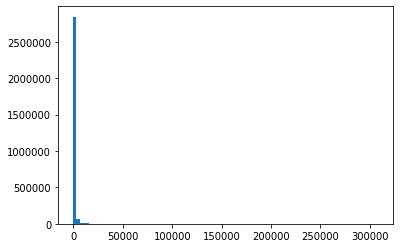

In [85]:
# Item price distribution
_ = plt.hist(new_train['item_price'], bins=100)

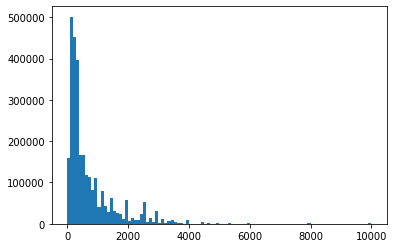

In [86]:
# Magnified item_price distribution
_ = plt.hist(new_train[new_train['item_price']<10000]['item_price'], bins=100)

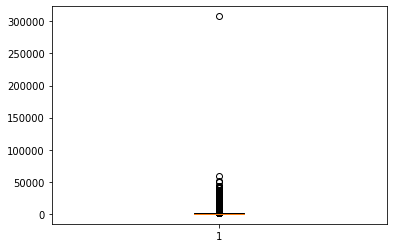

In [87]:
# Item price distribution
_ = plt.boxplot(new_train['item_price'])

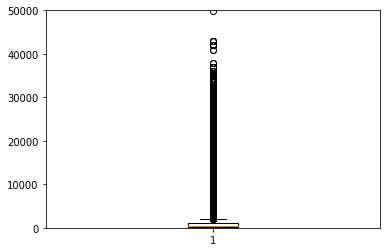

In [88]:
# Magnified item price distribution
_ = plt.boxplot(new_train['item_price'])
_ = plt.ylim(0,50000)

In [89]:
new_train['item_price'].sort_values(ascending=False)

2001599    307980.0000
2899475     59200.0000
2452519     50999.0000
2001635     49782.0000
2863368     42990.0000
              ...     
2584643         0.1000
2582914         0.0900
2606966         0.0875
2582951         0.0700
2606929         0.0700
Name: item_price, Length: 2935842, dtype: float64

Looking at the item price distribution, we can notice that most of the products are on the cheaper side, but also there are some products on the more expensive side. <br/>

**Distribution of both item_price and item_cnt_day are extremely skewed to the right.**

#### Inspect outliers

In [90]:
# Inspect item_cnt_day higher than 1000
new_train[new_train['item_cnt_day']>=1000]

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean,month_year
2760591,2015-01-15,24,12,20949,4.000000,1000.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,Интернет-магазин ЧС,интернет магазин чс,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши,"January, 2015"
2900504,2015-10-28,33,12,11373,0.908714,2169.0,Доставка до пункта выдачи (Boxberry),9,доставка до пункта выдачи boxberry,Интернет-магазин ЧС,интернет магазин чс,Доставка товара,доставка товара,"October, 2015"


Most sold products per day are corporate T-shirts and delivery. 

In [91]:
new_train[new_train['item_id']==20949]

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean,month_year
2737067,2013-04-24,3,59,20949,5.0,2.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Ярославль ТЦ ""Альтаир""",ярославль тц альтаир,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши,"April, 2013"
2737068,2013-04-26,3,59,20949,5.0,3.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Ярославль ТЦ ""Альтаир""",ярославль тц альтаир,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши,"April, 2013"
2737069,2013-04-27,3,59,20949,5.0,4.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Ярославль ТЦ ""Альтаир""",ярославль тц альтаир,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши,"April, 2013"
2737070,2013-04-28,3,59,20949,5.0,6.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Ярославль ТЦ ""Альтаир""",ярославль тц альтаир,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши,"April, 2013"
2737071,2013-04-29,3,59,20949,5.0,3.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Ярославль ТЦ ""Альтаир""",ярославль тц альтаир,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши,"April, 2013"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2768459,2015-10-27,33,36,20949,5.0,4.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Новосибирск ТРЦ ""Галерея Новосибирск""",новосибирск трц галерея новосибирск,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши,"October, 2015"
2768460,2015-10-28,33,36,20949,5.0,1.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Новосибирск ТРЦ ""Галерея Новосибирск""",новосибирск трц галерея новосибирск,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши,"October, 2015"
2768461,2015-10-29,33,36,20949,5.0,1.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Новосибирск ТРЦ ""Галерея Новосибирск""",новосибирск трц галерея новосибирск,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши,"October, 2015"
2768462,2015-10-30,33,36,20949,5.0,4.0,Фирменный пакет майка 1С Интерес белый (34*42)...,71,фирменный пакет майка 1с интерес белый 34 42 4...,"Новосибирск ТРЦ ""Галерея Новосибирск""",новосибирск трц галерея новосибирск,"Подарки - Сумки, Альбомы, Коврики д/мыши",подарки сумки альбомы коврики д мыши,"October, 2015"


In [92]:
new_train[new_train['item_id']==11373]

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean,month_year
2900047,2013-01-08,0,12,11373,1000.00,1.0,Доставка до пункта выдачи (Boxberry),9,доставка до пункта выдачи boxberry,Интернет-магазин ЧС,интернет магазин чс,Доставка товара,доставка товара,"January, 2013"
2900048,2013-01-31,0,12,11373,97.80,5.0,Доставка до пункта выдачи (Boxberry),9,доставка до пункта выдачи boxberry,Интернет-магазин ЧС,интернет магазин чс,Доставка товара,доставка товара,"January, 2013"
2900049,2013-02-01,1,12,11373,229.00,1.0,Доставка до пункта выдачи (Boxberry),9,доставка до пункта выдачи boxberry,Интернет-магазин ЧС,интернет магазин чс,Доставка товара,доставка товара,"February, 2013"
2900050,2013-02-04,1,12,11373,130.00,1.0,Доставка до пункта выдачи (Boxberry),9,доставка до пункта выдачи boxberry,Интернет-магазин ЧС,интернет магазин чс,Доставка товара,доставка товара,"February, 2013"
2900051,2013-03-29,2,12,11373,139.50,2.0,Доставка до пункта выдачи (Boxberry),9,доставка до пункта выдачи boxberry,Интернет-магазин ЧС,интернет магазин чс,Доставка товара,доставка товара,"March, 2013"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2900506,2015-10-07,33,12,11373,855.00,2.0,Доставка до пункта выдачи (Boxberry),9,доставка до пункта выдачи boxberry,Интернет-магазин ЧС,интернет магазин чс,Доставка товара,доставка товара,"October, 2015"
2900507,2015-10-06,33,12,11373,208.80,5.0,Доставка до пункта выдачи (Boxberry),9,доставка до пункта выдачи boxberry,Интернет-магазин ЧС,интернет магазин чс,Доставка товара,доставка товара,"October, 2015"
2900508,2015-10-05,33,12,11373,140.75,16.0,Доставка до пункта выдачи (Boxberry),9,доставка до пункта выдачи boxberry,Интернет-магазин ЧС,интернет магазин чс,Доставка товара,доставка товара,"October, 2015"
2900509,2015-10-02,33,12,11373,648.50,2.0,Доставка до пункта выдачи (Boxberry),9,доставка до пункта выдачи boxberry,Интернет-магазин ЧС,интернет магазин чс,Доставка товара,доставка товара,"October, 2015"


In [93]:
# Check number of items sold in October, 2015 by store with id 12
new_train[(new_train['date']=='2015-10-28') & (new_train['shop_id']==12) & (new_train['item_id']!=11373)]['item_cnt_day'].sum()

90.0

In the same day internet store had sales of 90 items and 2169 deliveries. Since there are less sales than deliveries this value will be removed.

In [94]:
# Remove item_cnt_day bigger than 1000
new_train=new_train[new_train['item_cnt_day']< 2000]

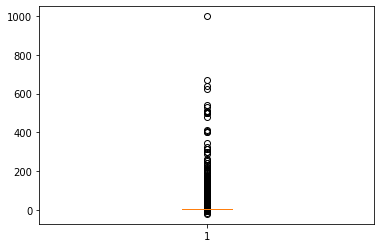

In [95]:
# Distribution of item count per day
_ = plt.boxplot(new_train['item_cnt_day'])

In [96]:
# Inspect item_price higher than 100000
new_train[new_train['item_price']>=100000]

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean,month_year
2001599,2013-12-13,11,12,6066,307980.0,1.0,Radmin 3 - 522 лиц.,75,radmin 3 522 лиц,Интернет-магазин ЧС,интернет магазин чс,Программы - Для дома и офиса,программы для дома и офиса,"December, 2013"


In [97]:
new_train[new_train['item_id']==6066]

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,items_name_clean,shop_name,shop_name_clean,item_category_name,item_category_name_clean,month_year
2001599,2013-12-13,11,12,6066,307980.0,1.0,Radmin 3 - 522 лиц.,75,radmin 3 522 лиц,Интернет-магазин ЧС,интернет магазин чс,Программы - Для дома и офиса,программы для дома и офиса,"December, 2013"


The item with biggest price is licence for Radmin 3. When checked online it could be found that licence price for Radmin 3 is possible. Interestingly this item appears just once. Since this value is far from the majority of price and appears just once in dataset it will be removed.

In [98]:
# Remove item_price higher than 100000
new_train=new_train[new_train['item_price']<100000]

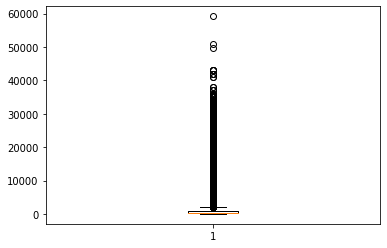

In [99]:
_ = plt.boxplot(new_train['item_price'])

### Month sales

In [100]:
month_count=new_train.groupby('month_year').sum()['item_cnt_day'].sort_values(ascending=False).to_frame().reset_index()

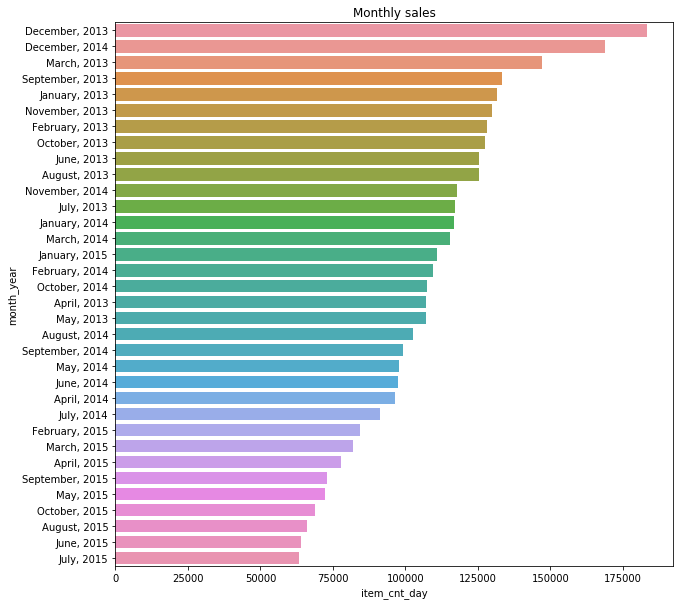

In [101]:
_ = plt.figure(figsize=(10,10))
_ = sns.barplot(x=month_count['item_cnt_day'], y=month_count['month_year'])
_ = plt.title('Monthly sales')

Looking at the count of months and year combination, it could be noticed that stores had bigger sales during 2013 and 2014 than during 2015. We can observed a decreasing trend.<br/>
The biggest sale is observed during December of 2013 and 2014, and the lowest sales are observed during 2015.

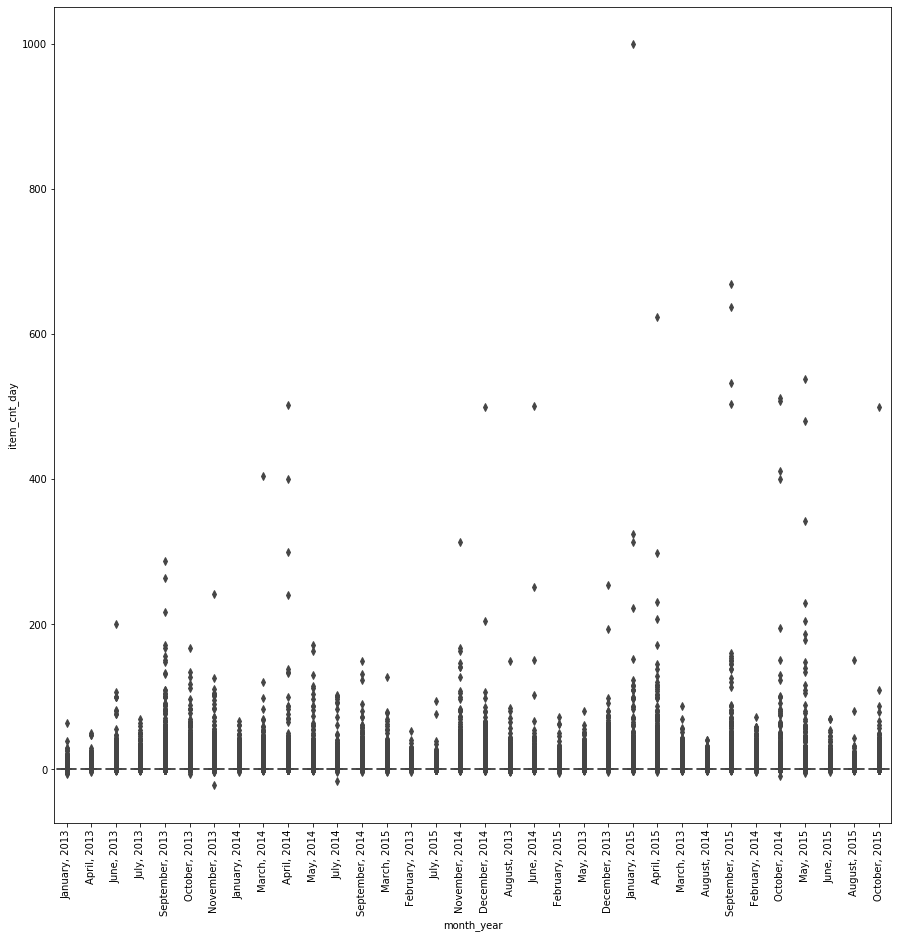

In [102]:
# Distribution of item_cnt_day per month
_ = plt.figure(figsize=(15,15))
_ = sns.boxplot(x="month_year", y="item_cnt_day", data=new_train)
#_ = plt.ylim(0,10)
_ = plt.xticks(rotation=90)

Majority of items are sold one per day, so distribution for each month looks the same but it could be noticed that there is a lot of outliers and that they very from month to month. Even if the graph is magnified still there will be no differences in the distribution.

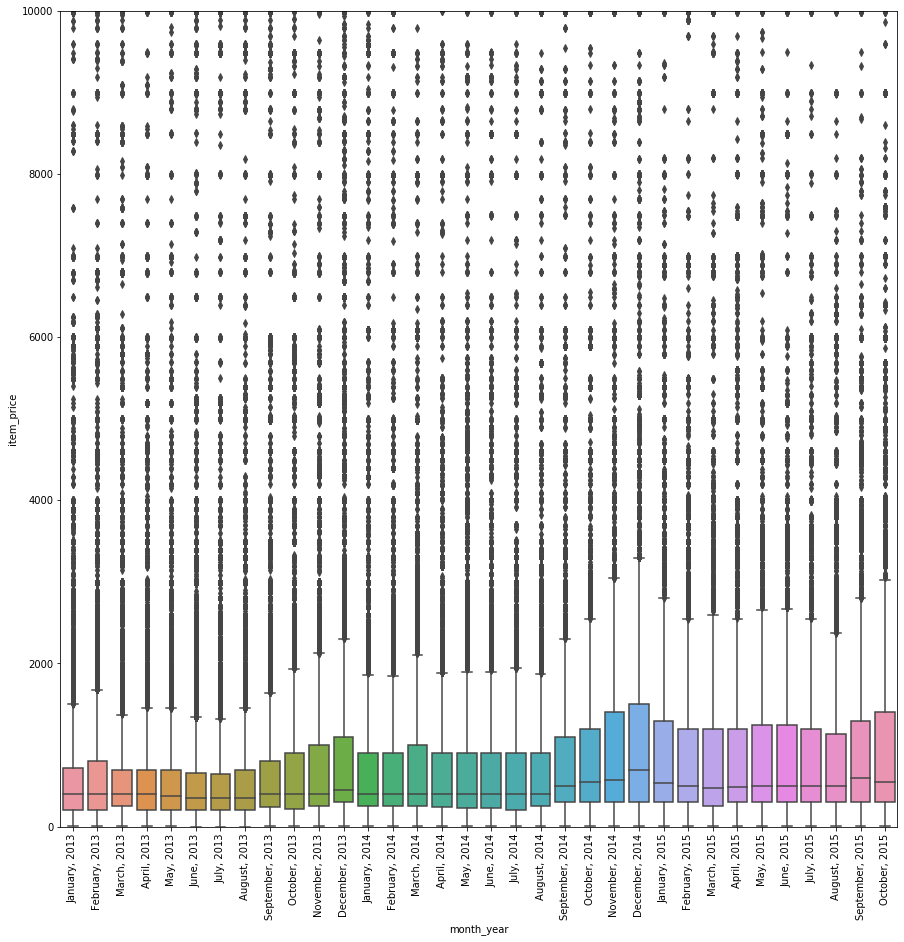

In [103]:
# Distribution of item_price per month
_ = plt.figure(figsize=(15,15))
_ = sns.boxplot(x="month_year", y="item_price", data=new_train.sort_values('date_block_num'))
_ = plt.ylim(0,10000)
_ = plt.xticks(rotation=90)

Looking at the distribution of prices per month it could be noticed that there are differences between item prices per month. This differences could be caused by having different items in shops every month (this fact is mentioned in the data documentation). Majority of the prices are on the cheaper side, so there are a lot of outliers. <br/>
In general it seems that prices are slightly increasing from 2013 to 2015. Prices are usually higher at the end of the year and begining of the year, and got lower at the middle of the year.

In [104]:
# Check if shops have diferent items per month
shops = new_train['shop_id'].unique()
months = new_train['date_block_num'].unique()
c_d=0
c_s=0
for shop in shops:
    item_list=[]
    for month in months:
        shop_month = set(new_train[(new_train['shop_id']==shop) & (new_train['date_block_num']==month)]['item_id'].unique().tolist())
        item_list.append(shop_month)
    for i in range(len(item_list)-2):
        a = item_list[i]
        b = item_list[i+1]
        diff1 = a-b
        diff2 = b-a
        if len(diff1) == 0 and len(diff2) == 0:
            c_s=c_s+1
        else:
            c_d=c_d+1
print("Number of months when stores had different items: {}".format(c_d) + "\n" + "Number of month when stores had same items: {}".format(c_s))

Number of months when stores had different items: 1573
Number of month when stores had same items: 251


### Sales per shop and city

In [105]:
shop_product=new_train.groupby(['shop_id', 'shop_name']).sum()['item_cnt_day'].sort_values(ascending=False).to_frame().reset_index()
shop_product

,shop_id,shop_name,item_cnt_day
0,31,"Москва ТЦ ""Семеновский""",310777.0
1,25,"Москва ТРК ""Атриум""",241919.0
2,54,"Химки ТЦ ""Мега""",185789.0
3,28,"Москва ТЦ ""МЕГА Теплый Стан"" II",184557.0
4,57,"Якутск Орджоникидзе, 56",152812.0
5,42,"СПб ТК ""Невский Центр""",144933.0
6,27,"Москва ТЦ ""МЕГА Белая Дача II""",136657.0
7,6,"Воронеж (Плехановская, 13)",100489.0
8,58,"Якутск ТЦ ""Центральный""",88045.0
9,46,"Сергиев Посад ТЦ ""7Я""",78990.0


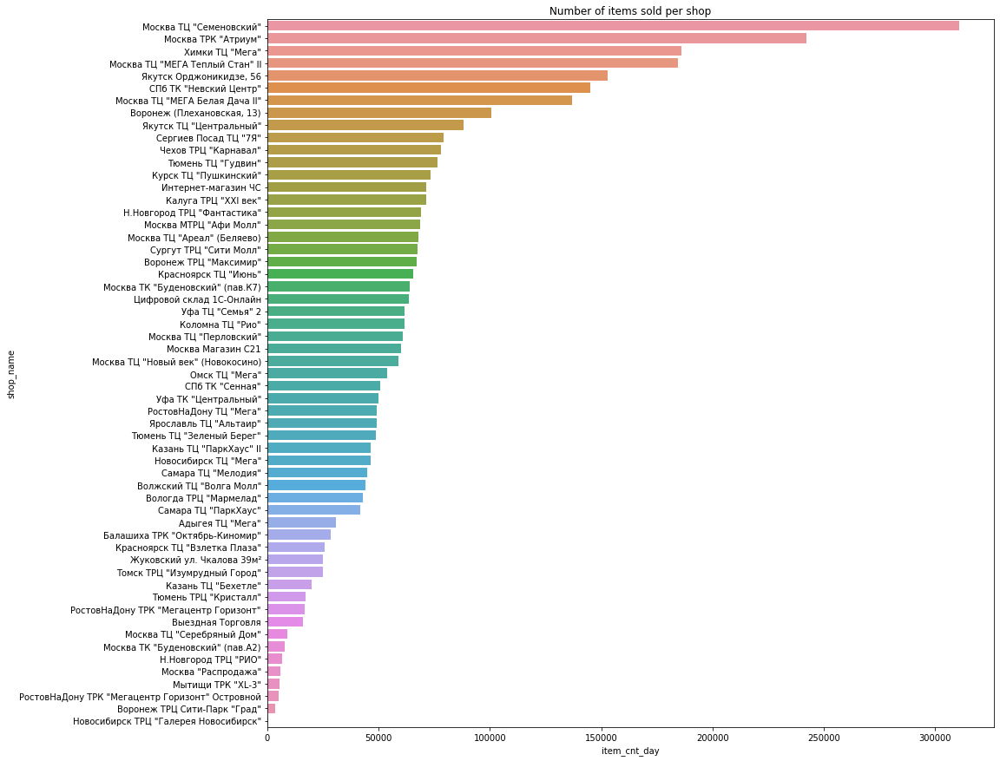

In [106]:
# Plot store sales
_ = plt.figure(figsize=(15,15))
_ = sns.barplot(x=shop_product['item_cnt_day'], y=shop_product['shop_name'], orient="h", order=shop_product.sort_values('item_cnt_day', ascending=False)['shop_name'])
_ = plt.title('Number of items sold per shop')

Store with the biggest sale is store 31. This store has more than 300000 sales. <br/>
Stores with the smallest sale frequency is 36. These store have less than 1000 sales. 

In [107]:
new_train.groupby(['shop_id', 'item_id']).sum()['item_cnt_day'].sort_values(ascending=False).reset_index()

,shop_id,item_id,item_cnt_day
0,31,20949,19934.0
1,25,20949,14343.0
2,28,20949,13458.0
3,54,20949,12323.0
4,42,20949,10514.0
...,...,...,...
417860,28,8775,-1.0
417861,12,19360,-1.0
417862,18,17407,-1.0
417863,12,1593,-7.0


Shop with id 31 is the store that sales most of the products, and most sold product is 20949. From the table is obvious that this product is most sold product in more than one store.<br/>
Store with id 12 apperently has the most number of negative sales.

#### Separate city

First word in shop name is the name of the city, except for online shopping. By creating 'city' feature, it could be checked if place has influence on the sales.

In [108]:
# Create city feature
new_train['city']=new_train['shop_name'].map(lambda x: x.split()[0])
new_train.loc[new_train.city == '!Якутск', 'city']= 'Якутск'

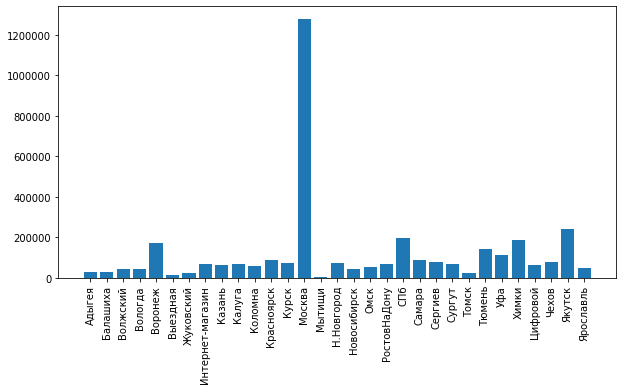

In [109]:
# Plot number of products sold per city
_ = plt.figure(figsize=(10,5))
_ = plt.bar(x = new_train.groupby('city').sum()['item_cnt_day'].index, height=new_train.groupby('city').sum()['item_cnt_day'].values)
_ = plt.xticks(rotation=90)

The biggest sale is observed in the Moscow. Comparing to the other cities and even internet stores, Moscow has by far much bigger sale than any other city/internet store. 

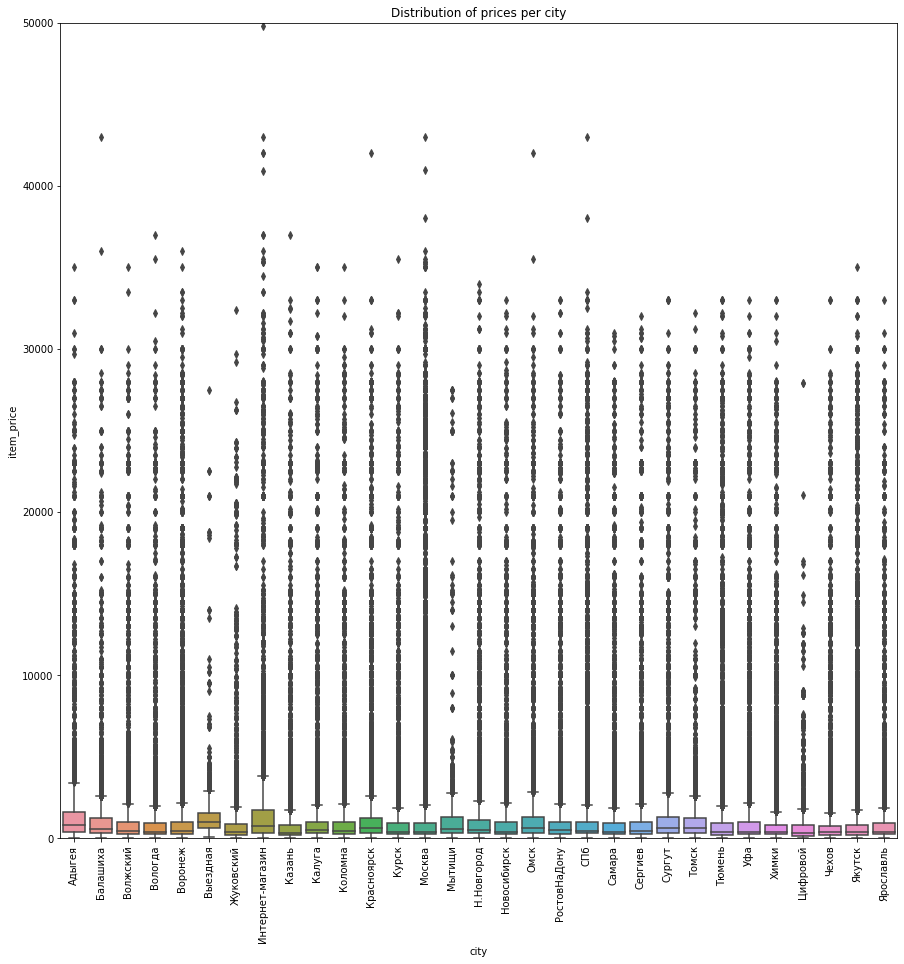

In [110]:
# Distribution of prices per city
_ = plt.figure(figsize=(15,15))
_ = sns.boxplot(x="city", y="item_price", data=new_train.sort_values('city'))
_ = plt.ylim(0,50000)
_ = plt.xticks(rotation=90)
_ = plt.title('Distribution of prices per city')

Distribution of prices per city are similar. The biggest prices are observed in internet-magazine store.

### Sales per category

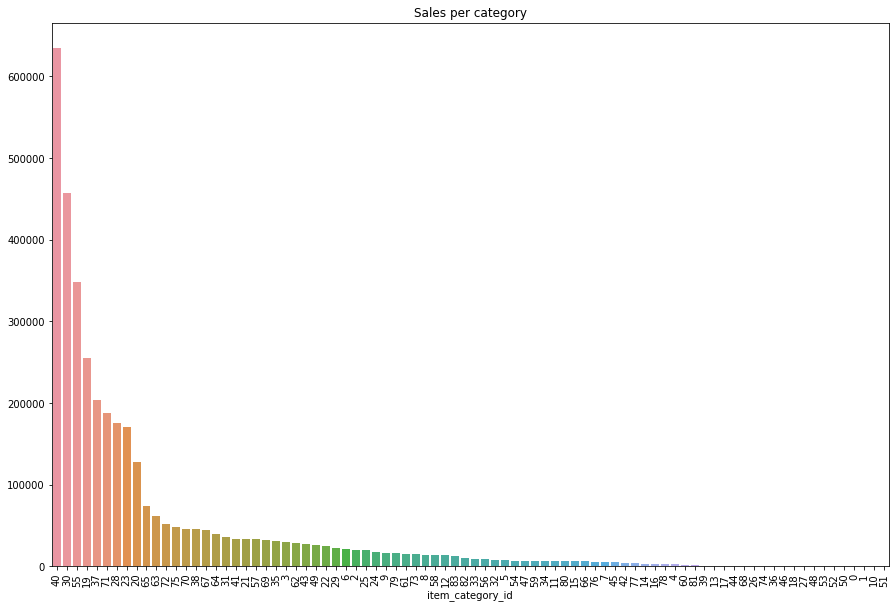

In [111]:
# Check sales per category
_ = plt.figure(figsize=(15,10))
_ = sns.barplot(x = new_train.groupby('item_category_id').sum()['item_cnt_day'].index, y=new_train.groupby('item_category_id').sum()['item_cnt_day'].values, order=new_train.groupby('item_category_id').sum().sort_values('item_cnt_day', ascending=False).index)
_ = plt.xticks(rotation=90)
_ = plt.title('Sales per category')

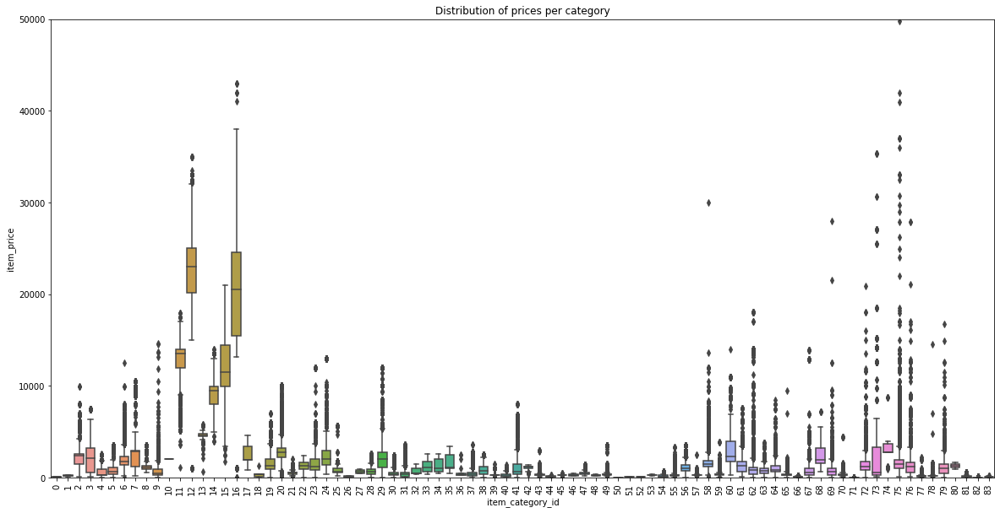

In [112]:
# Distribution of prices per category
_ = plt.figure(figsize=(20,10))
_ = sns.boxplot(x="item_category_id", y="item_price", data=new_train)
_ = plt.ylim(0,50000)
_ = plt.xticks(rotation=90)
_ = plt.title('Distribution of prices per category')

The most items are sold from category 40. This category also has the biggest number of items. There are nine categories where more than 100000 items are sold for time period od January 2013 to October 2015. <br/>
Looking at the distribution of prices per category it could be noticed that most of the categories have lower prices.

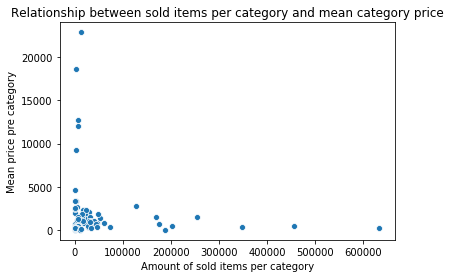

In [113]:
# Check relationship between category sales and prices
_ = sns.scatterplot(x=new_train.groupby('item_category_id').sum()['item_cnt_day'].values, y=new_train.groupby('item_category_id').mean()['item_price'].values)
_ = plt.xlabel('Amount of sold items per category')
_ = plt.ylabel('Mean price pre category')
_ = plt.title('Relationship between sold items per category and mean category price')

From the scatter plot it could be notices that there is no correlation between number of sold items per category and the mean category price.

## Timeseries exploration

The objective if to predict sales for the next month for shop-item pair. For that reason we will take a look at sales at month level and year level.

In [114]:
# Prepare dataset for timeseries analysis
sales = new_train.drop(['item_name', 'items_name_clean', 'shop_name', 'shop_name_clean', 'item_category_name', 'item_category_name_clean'], axis=1)

In [115]:
sales['day_month_year']=sales['date'].apply(lambda x: x.strftime("%d, %B, %Y, %a"))
sales

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_category_id,month_year,city,day_month_year
0,2013-01-02,0,59,22154,999.0,1.0,37,"January, 2013",Ярославль,"02, January, 2013, Wed"
1,2013-04-26,3,59,944,150.0,1.0,37,"April, 2013",Ярославль,"26, April, 2013, Fri"
2,2013-06-26,5,59,944,199.5,1.0,37,"June, 2013",Ярославль,"26, June, 2013, Wed"
3,2013-07-20,6,59,944,199.5,1.0,37,"July, 2013",Ярославль,"20, July, 2013, Sat"
4,2013-09-14,8,59,944,299.0,2.0,37,"September, 2013",Ярославль,"14, September, 2013, Sat"
...,...,...,...,...,...,...,...,...,...,...
2935838,2015-10-22,33,55,13093,250.0,1.0,36,"October, 2015",Цифровой,"22, October, 2015, Thu"
2935839,2015-09-21,32,55,13091,1000.0,1.0,36,"September, 2015",Цифровой,"21, September, 2015, Mon"
2935840,2015-09-16,32,55,13094,2500.0,1.0,36,"September, 2015",Цифровой,"16, September, 2015, Wed"
2935841,2015-09-22,32,55,13094,2500.0,2.0,36,"September, 2015",Цифровой,"22, September, 2015, Tue"


### Time series per month

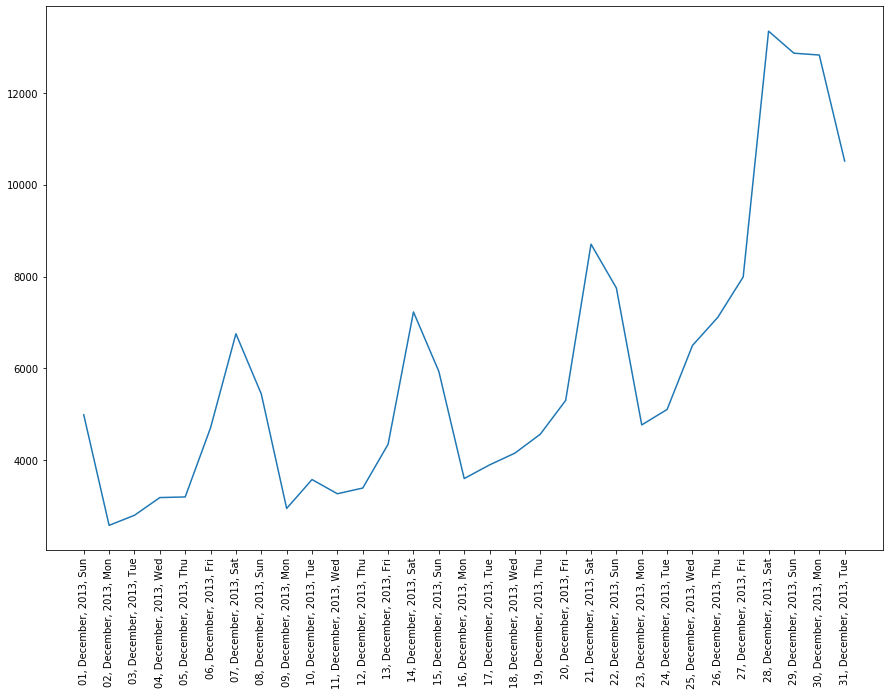

In [116]:
ts_d = sales[(sales['month_year']=='December, 2013')].groupby('day_month_year')['item_cnt_day'].sum()
_ = plt.figure(figsize=(15,10))
_ = plt.plot(ts_d)
_ = plt.xticks(rotation=90)

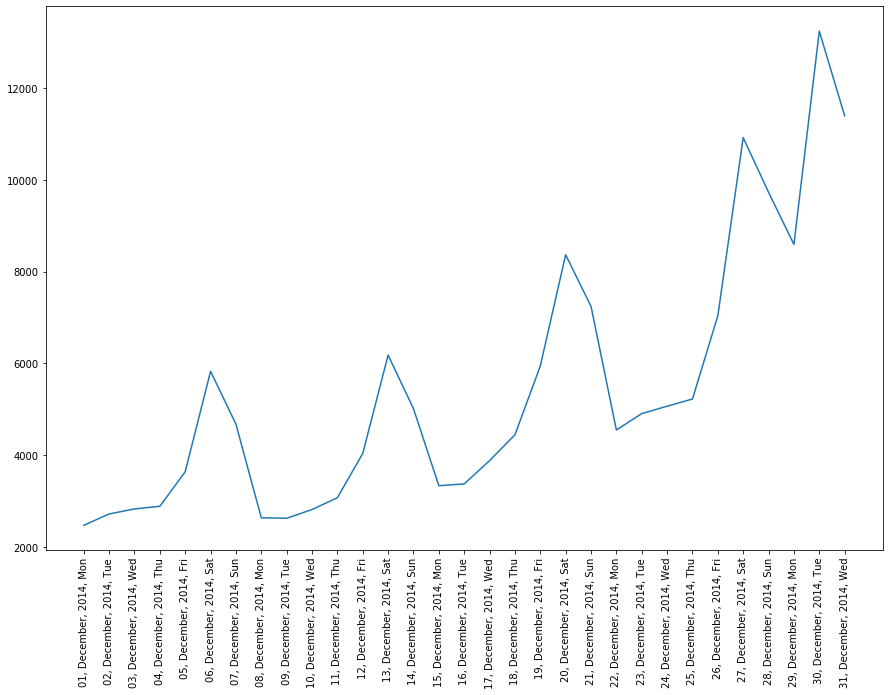

In [117]:
ts_d = sales[(sales['month_year']=='December, 2014')].groupby('day_month_year')['item_cnt_day'].sum()
_ = plt.figure(figsize=(15,10))
_ = plt.plot(ts_d)
_ = plt.xticks(rotation=90)

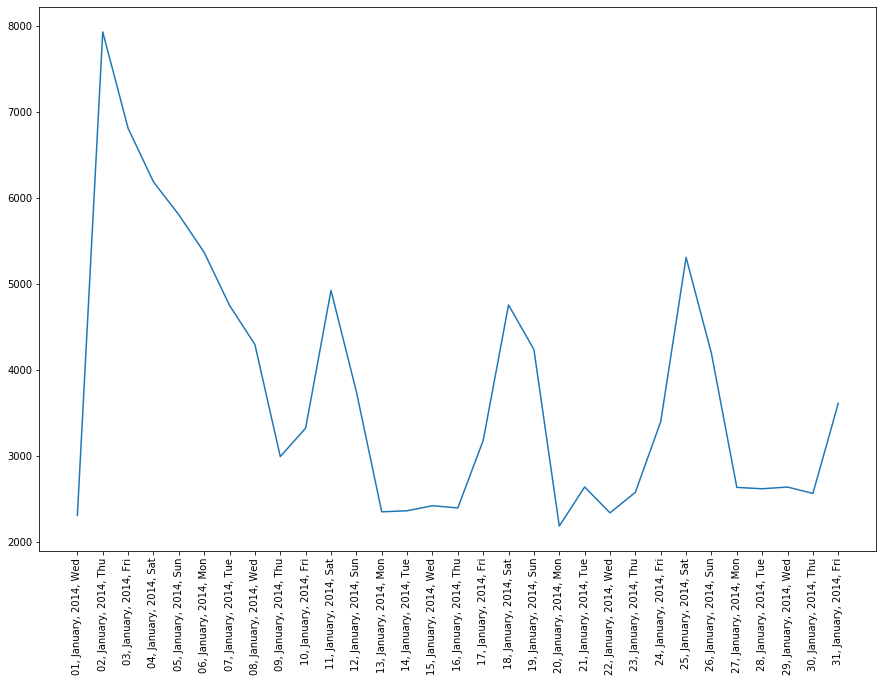

In [118]:
ts_d = sales[(sales['month_year']=='January, 2014')].groupby('day_month_year')['item_cnt_day'].sum()
_ = plt.figure(figsize=(15,10))
_ = plt.plot(ts_d)
_ = plt.xticks(rotation=90)

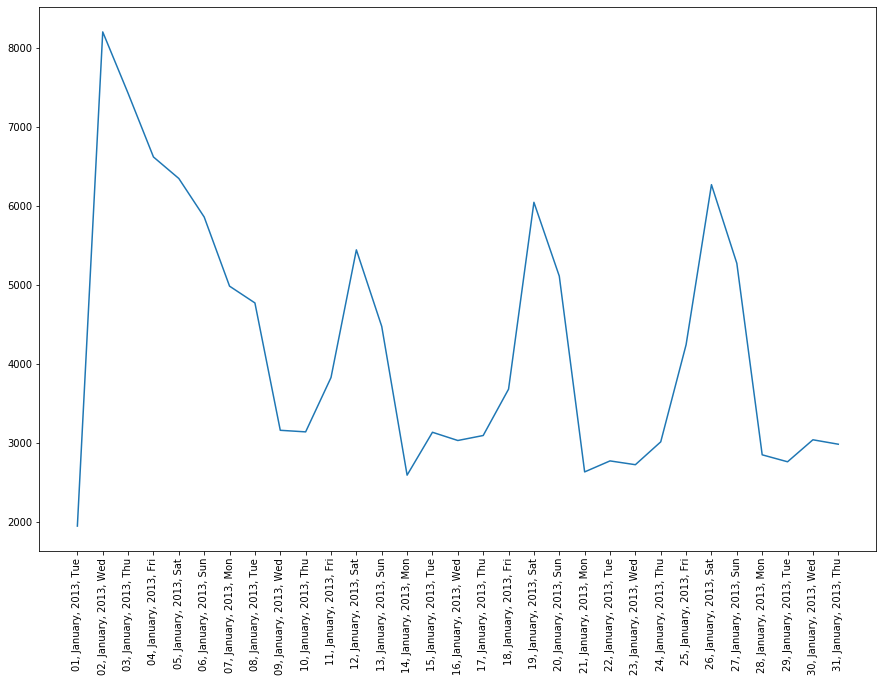

In [119]:
ts_d = sales[(sales['month_year']=='January, 2013')].groupby('day_month_year')['item_cnt_day'].sum()
_ = plt.figure(figsize=(15,10))
_ = plt.plot(ts_d)
_ = plt.xticks(rotation=90)

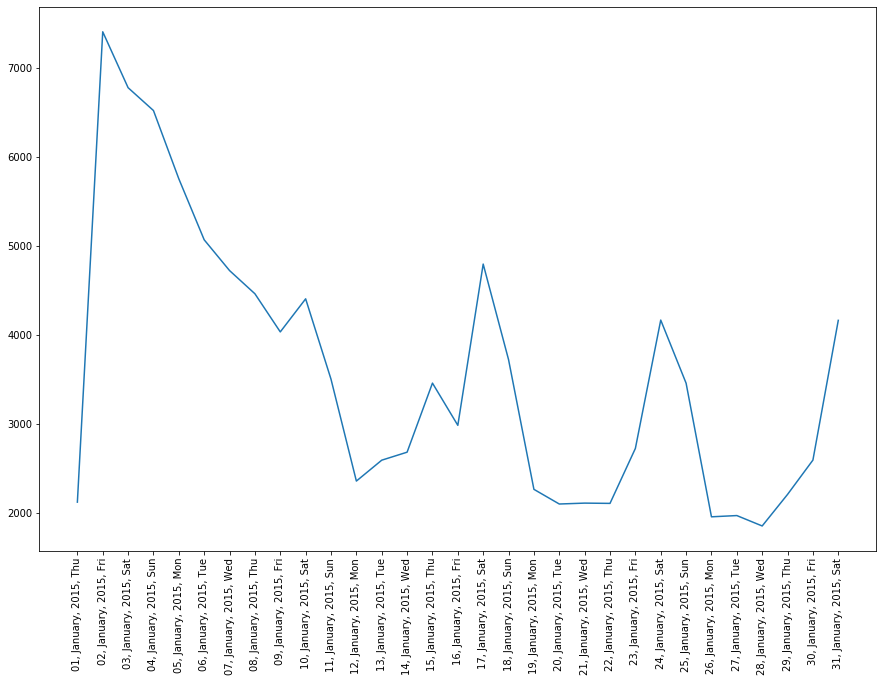

In [120]:
ts_d = sales[(sales['month_year']=='January, 2015')].groupby('day_month_year')['item_cnt_day'].sum()
_ = plt.figure(figsize=(15,10))
_ = plt.plot(ts_d)
_ = plt.xticks(rotation=90)

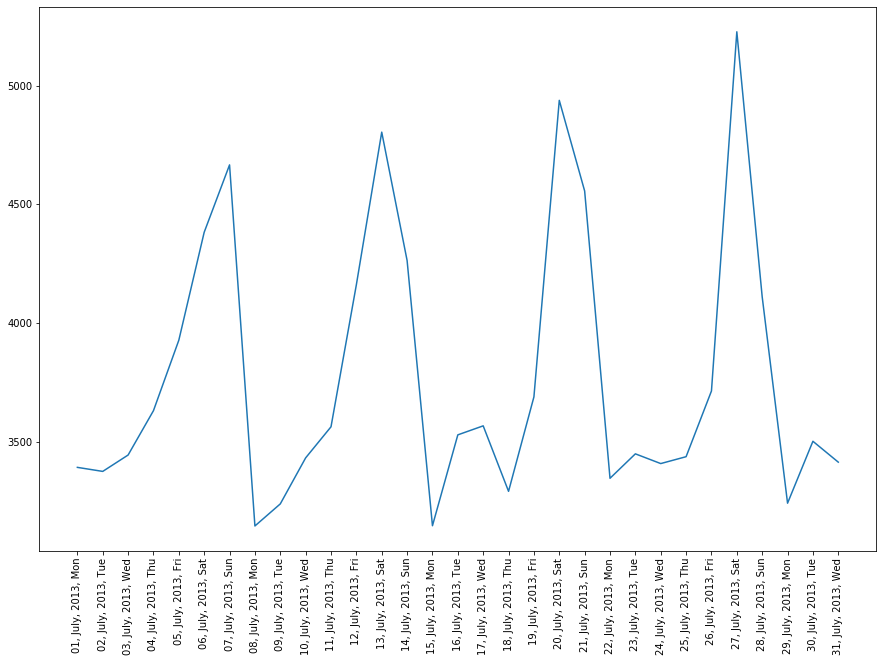

In [121]:
ts_d = sales[(sales['month_year']=='July, 2013')].groupby('day_month_year')['item_cnt_day'].sum()
_ = plt.figure(figsize=(15,10))
_ = plt.plot(ts_d)
_ = plt.xticks(rotation=90)

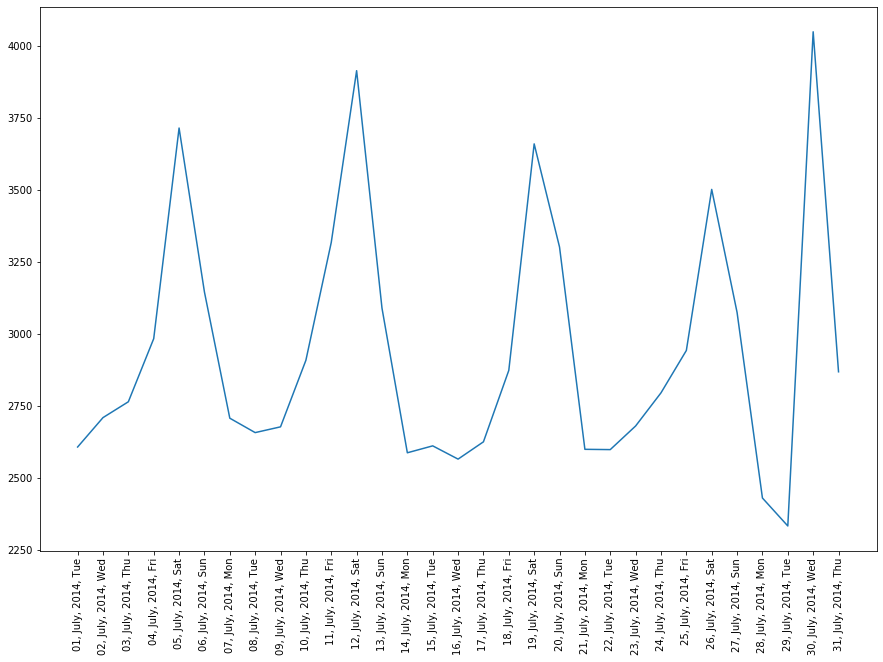

In [122]:
ts_d = sales[(sales['month_year']=='July, 2014')].groupby('day_month_year')['item_cnt_day'].sum()
_ = plt.figure(figsize=(15,10))
_ = plt.plot(ts_d)
_ = plt.xticks(rotation=90)

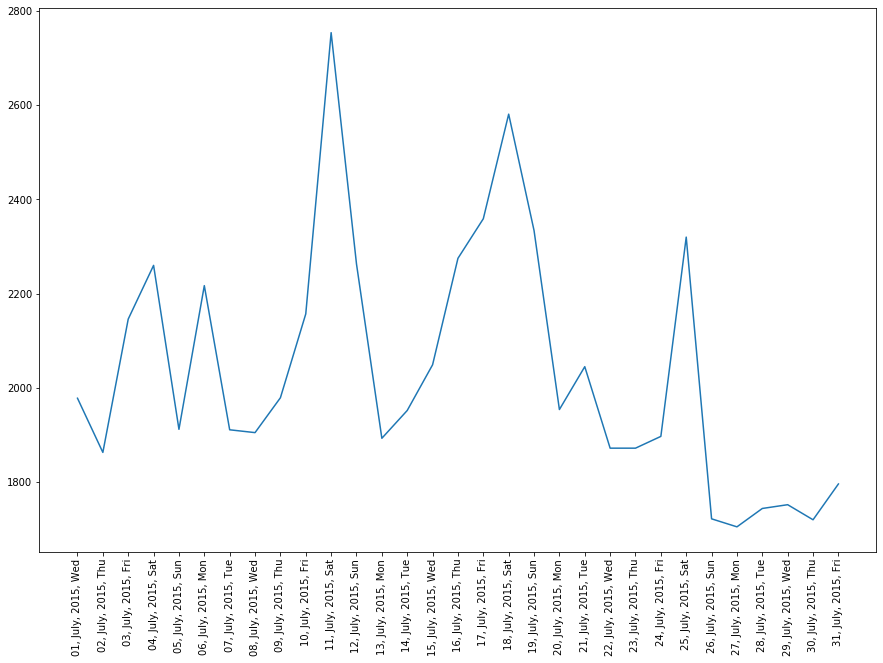

In [123]:
ts_d = sales[(sales['month_year']=='July, 2015')].groupby('day_month_year')['item_cnt_day'].sum()
_ = plt.figure(figsize=(15,10))
_ = plt.plot(ts_d)
_ = plt.xticks(rotation=90)

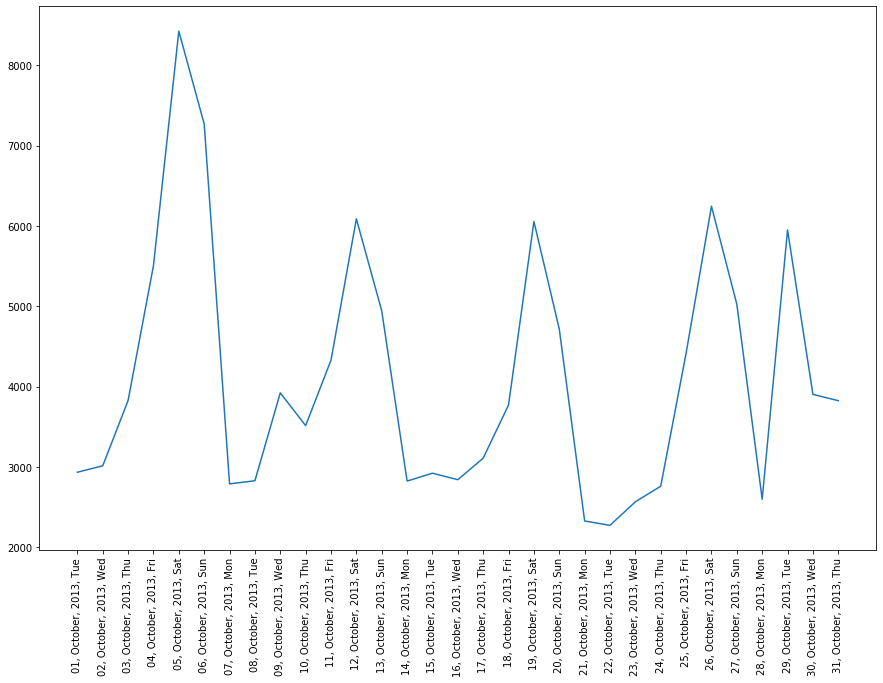

In [124]:
ts_d = sales[(sales['month_year']=='October, 2013')].groupby('day_month_year')['item_cnt_day'].sum()
_ = plt.figure(figsize=(15,10))
_ = plt.plot(ts_d)
_ = plt.xticks(rotation=90)

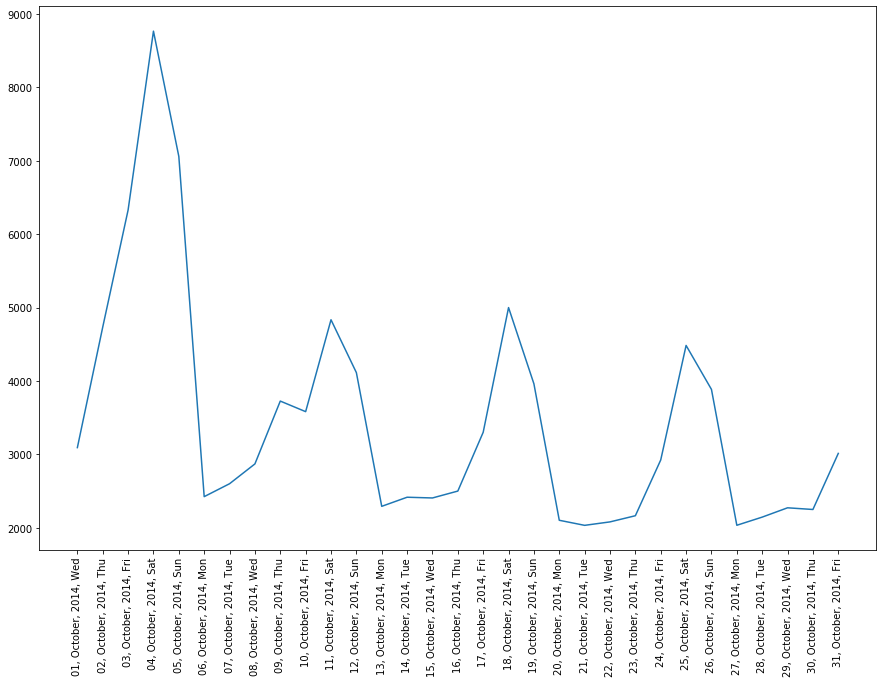

In [125]:
ts_d = sales[(sales['month_year']=='October, 2014')].groupby('day_month_year')['item_cnt_day'].sum()
_ = plt.figure(figsize=(15,10))
_ = plt.plot(ts_d)
_ = plt.xticks(rotation=90)

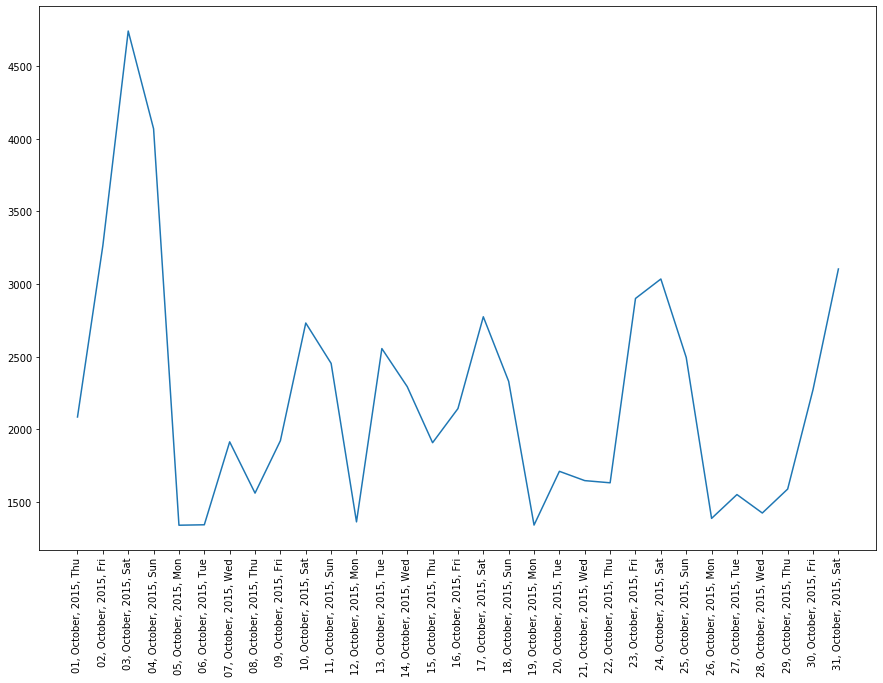

In [126]:
ts_d = sales[(sales['month_year']=='October, 2015')].groupby('day_month_year')['item_cnt_day'].sum()
_ = plt.figure(figsize=(15,10))
_ = plt.plot(ts_d)
_ = plt.xticks(rotation=90)

Looking at the timeseries for several months and through years, spikes in sales are noticed during the weekend, from Friday to Sunday. <br/>
At the end of the December and beginning of January we can notice spike in sales, probably caused by the New Year.
Comparing same months through all three years we can notice decreasing trend in sales, espacially in 2015.

In [127]:
del ts_d

gc.collect()

39787

### Time series per year

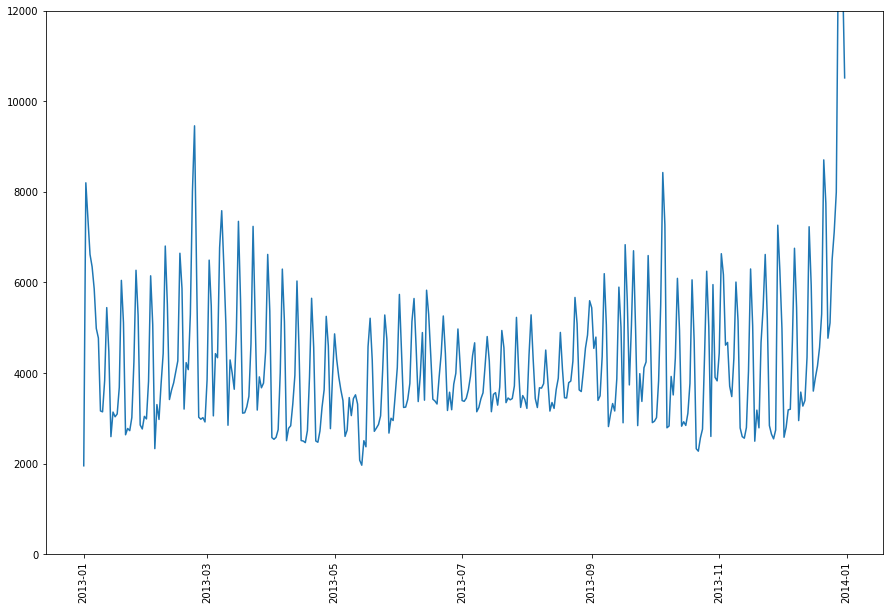

In [128]:
# 2013
_ = plt.figure(figsize=(15,10))
_ = plt.plot(sales[sales['date_block_num']<12].groupby('date')['item_cnt_day'].sum())
_ = plt.ylim(0,12000)
_ = plt.xticks(rotation=90)

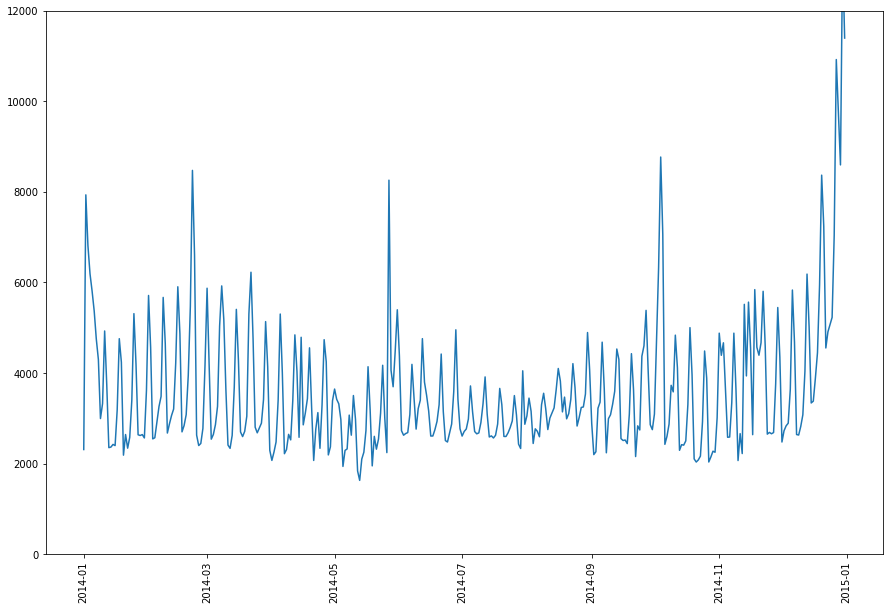

In [129]:
# 2014
_ = plt.figure(figsize=(15,10))
_ = plt.plot(sales[(sales['date_block_num']>11) & (sales['date_block_num']<24)].groupby('date')['item_cnt_day'].sum())
_ = plt.ylim(0,12000)
_ = plt.xticks(rotation=90)

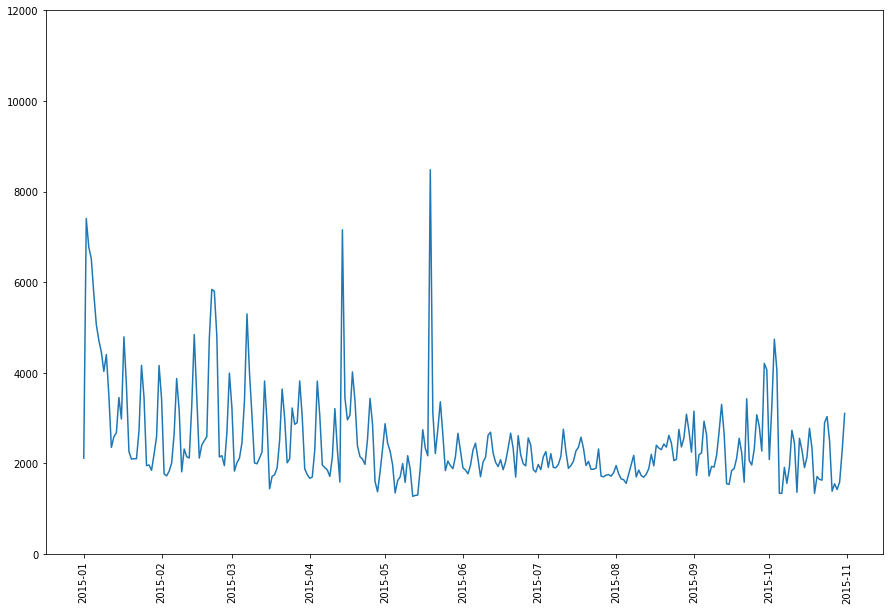

In [130]:
# 2015
_ = plt.figure(figsize=(15,10))
_ = plt.plot(sales[(sales['date_block_num']>23)].groupby('date')['item_cnt_day'].sum())
_ = plt.ylim(0,12000)
_ = plt.xticks(rotation=90)

On all three graphs peaks for weeks could be noticed. Also there is a lot of fluctuations in sales during years. On graph for 2013 and 2014 there are rise is sales and peak of sales in December. <br/>
Sales for 2013 and 2014 look similar while sales for 2015 is different. Besides that less items are sold in general, in 2015 there is a peak in april that is not visible for 2013 and 2014. Also in 2015 peak for October is lacking.

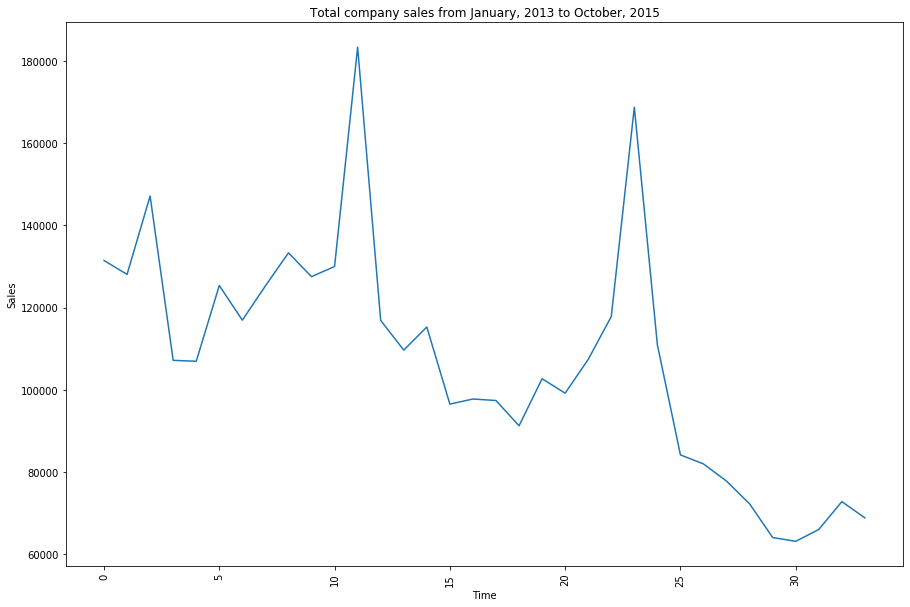

In [131]:
# Timeseries for entire time period
ts_y = sales.groupby('date_block_num')['item_cnt_day'].sum()
_ = plt.figure(figsize=(15,10))
_ = plt.plot(ts_y)
_ = plt.xticks(rotation=90)
_ = plt.title('Total company sales from January, 2013 to October, 2015')
_ = plt.xlabel('Time')
_ = plt.ylabel('Sales')

Check trend, seasonality, residuals

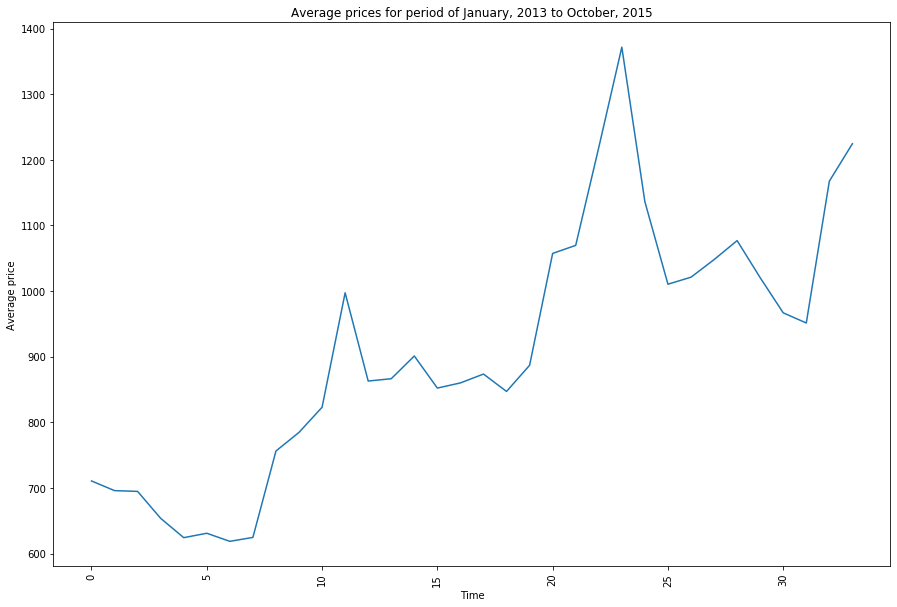

In [132]:
# Timeseries for entire time period
ts_y = sales.groupby('date_block_num')['item_price'].mean()
_ = plt.figure(figsize=(15,10))
_ = plt.plot(ts_y)
_ = plt.xticks(rotation=90)
_ = plt.title('Average prices for period of January, 2013 to October, 2015')
_ = plt.xlabel('Time')
_ = plt.ylabel('Average price')

In [133]:
del sales
del ts_y

gc.collect()

13401

## Feature engineering

Create data set in order to predict shop-item sales for the next month. Variablen in the dataset:
1. Generate all combinations shop-item per month
1. target - monthly sales (item_cnt_month)
2. month - as numbers from 0 to 33
3. shop_id
4. item_id


In [134]:
# Create dataframe with all combinations of shop_id and item_id per month (date_block_num)
from itertools import product

index_cols = ['shop_id', 'item_id', 'date_block_num']


df = []
for block_num in new_train['date_block_num'].unique():
    cur_shops = new_train.loc[new_train['date_block_num'] == block_num, 'shop_id'].unique()
    cur_items = new_train.loc[new_train['date_block_num'] == block_num, 'item_id'].unique()
    df.append(np.array(list(product(*[cur_shops, cur_items, [block_num]])),dtype='int32'))

df = pd.DataFrame(np.vstack(df), columns = index_cols,dtype=np.int32)
df.head()

,shop_id,item_id,date_block_num
0,59,22154,0
1,59,21759,0
2,59,21347,0
3,59,22015,0
4,59,18977,0


In [135]:
df.shape

(10889744, 3)

In [136]:
# Create target variable - monthly sales - target vaariable
sales_data = new_train.groupby(['date_block_num', 'shop_id', 'item_id']).agg({'item_cnt_day':['sum']})
sales_data.columns=['item_cnt_month']
sales_data.reset_index(inplace=True)

### Exploratory analysis of target variable

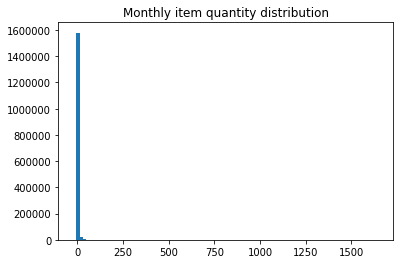

In [137]:
_ = plt.hist(sales_data['item_cnt_month'], bins=100)
_ = plt.title('Monthly item quantity distribution')

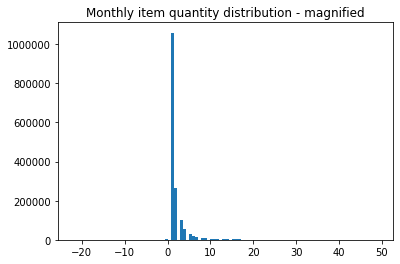

In [138]:
# Magnified histogram upto 50 item_cnt_month
_ = plt.hist(sales_data[sales_data['item_cnt_month']<50]['item_cnt_month'], bins=100)
_ = plt.title('Monthly item quantity distribution - magnified')

Looking at the magnified histogram products that are sold in quantites more than 20 per month are really rare.

In [139]:
# Percentage of entries with item_cnt_month more than 20
sales_data[sales_data['item_cnt_month']>20].shape[0]
(sales_data[sales_data['item_cnt_month']>20].shape[0]/sales_data.shape[0])*100

11463

0.7125726839056666

In less than 1% of entries item_cnt_month is higher than 20.

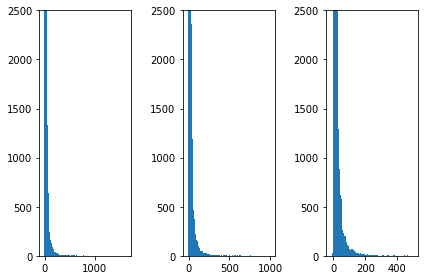

In [140]:
_ = plt.subplot(1,3,1)
_ = plt.hist(sales_data['item_cnt_month'], bins=100)
_ = plt.ylim(0,2500)

_ = plt.subplot(1,3,2)
_ = plt.hist(sales_data[sales_data['item_cnt_month']<=1000]['item_cnt_month'], bins=100)
_ = plt.ylim(0,2500)

_ = plt.subplot(1,3,3)
_ = plt.hist(sales_data[sales_data['item_cnt_month']<=500]['item_cnt_month'], bins=100)
_ = plt.ylim(0,2500)

_ = plt.tight_layout()

Looking at the distribution graphs it could be noticed that majority of the items per shop and month are sold in lower quantites. Items that are sold in quantites more than 200 are almost invisible in the graph.

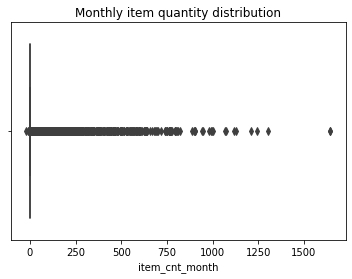

In [141]:
# Check the outliers for item_cnt_month
_ =sns.boxplot(sales_data['item_cnt_month'])
_ = plt.title('Monthly item quantity distribution')

In [142]:
# Calculate IQR, lower and upper bound
cnt_q1 = np.percentile(sales_data['item_cnt_month'],25)
cnt_q3 = np.percentile(sales_data['item_cnt_month'],75)
cnt_iqr = cnt_q3-cnt_q1
cnt_lower = cnt_iqr * (-1.5) + cnt_q1
cnt_upper = cnt_iqr * 1.5 + cnt_q3

In [143]:
print(cnt_q1)
print(cnt_q3)
print(cnt_iqr)
print(cnt_lower)
print(cnt_upper)

1.0
2.0
1.0
-0.5
3.5


From a values for lower and upper bound we can also notice thatmajority of the items are sold in small quantites.

In [144]:
# Percentage of values more than upper bound
(sales_data[sales_data['item_cnt_month']>3.5].shape[0]/sales_data.shape[0])*100

# Since products cannot be sold in quantites more than 3.5 as a upper bound we will take 4
(sales_data[sales_data['item_cnt_month']>4].shape[0]/sales_data.shape[0])*100

# Percentage of values less than lower bound
(sales_data[sales_data['item_cnt_month']<-0.5].shape[0]/sales_data.shape[0])*100

# Since products cannot be sold in quantites less than -0.5 as a lower bound we will take 0
(sales_data[sales_data['item_cnt_month']<0].shape[0]/sales_data.shape[0])*100

11.071326890776152

7.754939148791741

0.055324931403301345

0.055324931403301345

Since percentage of the items with the negative sale is 0.05% we can replace those entries with the 0. Items with negative sales are probably returned items, but since there is not much of them and we need to predict sales, we can safely replace negative values with 0 meaning that there was no sales for those items. <br/>

On the other hand percentage of items with sales higher than the upperbound is 11% or 8% if we take 4 as a upper bound. If item_cnt_month for those entries is replaced with upperbound value of 4 distribution will probably singificatly change. 

In [145]:
from scipy import stats
# Check changes in distribution 
upperbound_changes = sales_data['item_cnt_month'].clip(sales_data['item_cnt_month'].min(), 4)

distribution_diff = stats.ks_2samp(sales_data['item_cnt_month'], upperbound_changes)
distribution_diff

Ks_2sampResult(statistic=0.0775493914879174, pvalue=0.0)

In [146]:
lowerbound_changes = sales_data['item_cnt_month'].clip(0, sales_data['item_cnt_month'].max())

distribution_diff = stats.ks_2samp(sales_data['item_cnt_month'], lowerbound_changes)
distribution_diff

Ks_2sampResult(statistic=0.0005532493140330135, pvalue=0.9663350878201628)

Changing values lower than 0 to 0 will not change distribution, while changing values higher than 4 to 4 will slighltly change distribution. We can increse higher bound. Since in less than 1% of entries item_cnt_month is higher than 20, we will try to set higherbound to 20.

In [147]:
# Check changes in distribution 
upperbound_changes = sales_data['item_cnt_month'].clip(sales_data['item_cnt_month'].min(), 20)

distribution_diff = stats.ks_2samp(sales_data['item_cnt_month'], upperbound_changes)
distribution_diff

Ks_2sampResult(statistic=0.007125726839056656, pvalue=6.712716900517916e-36)

In [148]:
# Check diff in distribution when lowerbound is 0 and higherbound is 20
changes = sales_data['item_cnt_month'].clip(0, 20)
distribution_diff = stats.ks_2samp(sales_data['item_cnt_month'], changes)
distribution_diff

Ks_2sampResult(statistic=0.007125726839056656, pvalue=6.712716900517916e-36)

There are changes in distribution if values lower than 0 are cliped to 0 and values higher than 20 are cliped to 20.

In [149]:
# Clip the outliers
sales_data['item_cnt_month'] = sales_data['item_cnt_month'].clip(0,20)

In [150]:
#sales_data = sales_data[sales_data['item_cnt_month']<=20]

In [151]:
#sales_data = sales_data[sales_data['item_cnt_month']>=0]

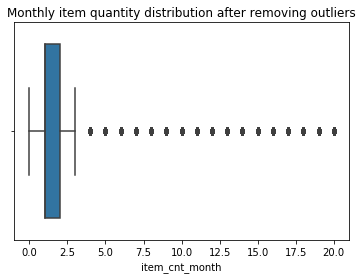

In [152]:
# Distribution of item_cnt_month after clipping values
_ = sns.boxplot(sales_data['item_cnt_month'])
_ = plt.title('Monthly item quantity distribution after removing outliers')

## Lag features

In [153]:
# Add sales for 1 and 12 months before specified month
def time_features(df, time_list, col):
    sales_tmp = df[['date_block_num', 'shop_id', 'item_id', col]]
    for i in time_list:
        monthly_cnt_sum = sales_tmp.copy()
        monthly_cnt_sum.columns = ['date_block_num', 'shop_id', 'item_id', col + '_lag_' + str(i)]
        monthly_cnt_sum['date_block_num'] += i
        df = pd.merge(df, monthly_cnt_sum, on=['date_block_num','shop_id','item_id'], how='left')
    return df

In [154]:
sales_data = time_features(sales_data, [1,2,3,6,12], 'item_cnt_month')
sales_data

,date_block_num,shop_id,item_id,item_cnt_month,item_cnt_month_lag_1,item_cnt_month_lag_2,item_cnt_month_lag_3,item_cnt_month_lag_6,item_cnt_month_lag_12
0,0,2,27,1.0,NaN,NaN,NaN,NaN,NaN
1,0,2,33,1.0,NaN,NaN,NaN,NaN,NaN
2,0,2,317,1.0,NaN,NaN,NaN,NaN,NaN
3,0,2,438,1.0,NaN,NaN,NaN,NaN,NaN
4,0,2,471,2.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
1608673,33,59,22087,6.0,3.0,2.0,5.0,2.0,6.0
1608674,33,59,22088,2.0,1.0,7.0,7.0,3.0,7.0
1608675,33,59,22091,1.0,3.0,NaN,NaN,NaN,1.0
1608676,33,59,22100,1.0,1.0,NaN,NaN,NaN,NaN


In [155]:
# Average sales per month
avg_month_sales = sales_data.groupby(['date_block_num']).agg({'item_cnt_month':['mean']})
avg_month_sales.columns=['avg_item_cnt_month']
avg_month_sales.reset_index(inplace=True)

sales_data = pd.merge(sales_data, avg_month_sales, on=['date_block_num'], how='left')
sales_data = time_features(sales_data, [1,2,3,6,12], 'avg_item_cnt_month')
sales_data

,date_block_num,shop_id,item_id,item_cnt_month,item_cnt_month_lag_1,item_cnt_month_lag_2,item_cnt_month_lag_3,item_cnt_month_lag_6,item_cnt_month_lag_12,avg_item_cnt_month,avg_item_cnt_month_lag_1,avg_item_cnt_month_lag_2,avg_item_cnt_month_lag_3,avg_item_cnt_month_lag_6,avg_item_cnt_month_lag_12
0,0,2,27,1.0,NaN,NaN,NaN,NaN,NaN,2.005616,NaN,NaN,NaN,NaN,NaN
1,0,2,33,1.0,NaN,NaN,NaN,NaN,NaN,2.005616,NaN,NaN,NaN,NaN,NaN
2,0,2,317,1.0,NaN,NaN,NaN,NaN,NaN,2.005616,NaN,NaN,NaN,NaN,NaN
3,0,2,438,1.0,NaN,NaN,NaN,NaN,NaN,2.005616,NaN,NaN,NaN,NaN,NaN
4,0,2,471,2.0,NaN,NaN,NaN,NaN,NaN,2.005616,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608673,33,59,22087,6.0,3.0,2.0,5.0,2.0,6.0,1.953156,1.943389,1.845125,1.769873,1.902951,2.168624
1608674,33,59,22088,2.0,1.0,7.0,7.0,3.0,7.0,1.953156,1.943389,1.845125,1.769873,1.902951,2.168624
1608675,33,59,22091,1.0,3.0,NaN,NaN,NaN,1.0,1.953156,1.943389,NaN,NaN,NaN,2.168624
1608676,33,59,22100,1.0,1.0,NaN,NaN,NaN,NaN,1.953156,1.943389,NaN,NaN,NaN,NaN


In [156]:
sales_data.drop(['avg_item_cnt_month'], axis=1, inplace=True)

In [157]:
# Average sales per month per store
avg_month_sales = sales_data.groupby(['date_block_num', 'shop_id']).agg({'item_cnt_month':['mean']})
avg_month_sales.columns=['avg_item_cnt_month_shop']
avg_month_sales.reset_index(inplace=True)

sales_data = pd.merge(sales_data, avg_month_sales, on=['date_block_num', 'shop_id'], how='left')
sales_data = time_features(sales_data, [1,2,3,6,12], 'avg_item_cnt_month_shop')
sales_data

,date_block_num,shop_id,item_id,item_cnt_month,item_cnt_month_lag_1,item_cnt_month_lag_2,item_cnt_month_lag_3,item_cnt_month_lag_6,item_cnt_month_lag_12,avg_item_cnt_month_lag_1,avg_item_cnt_month_lag_2,avg_item_cnt_month_lag_3,avg_item_cnt_month_lag_6,avg_item_cnt_month_lag_12,avg_item_cnt_month_shop,avg_item_cnt_month_shop_lag_1,avg_item_cnt_month_shop_lag_2,avg_item_cnt_month_shop_lag_3,avg_item_cnt_month_shop_lag_6,avg_item_cnt_month_shop_lag_12
0,0,2,27,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.574176,NaN,NaN,NaN,NaN,NaN
1,0,2,33,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.574176,NaN,NaN,NaN,NaN,NaN
2,0,2,317,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.574176,NaN,NaN,NaN,NaN,NaN
3,0,2,438,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.574176,NaN,NaN,NaN,NaN,NaN
4,0,2,471,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.574176,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608673,33,59,22087,6.0,3.0,2.0,5.0,2.0,6.0,1.943389,1.845125,1.769873,1.902951,2.168624,1.578000,1.861507,1.881956,1.663283,1.730189,1.8125
1608674,33,59,22088,2.0,1.0,7.0,7.0,3.0,7.0,1.943389,1.845125,1.769873,1.902951,2.168624,1.578000,1.861507,1.881956,1.663283,1.730189,1.8125
1608675,33,59,22091,1.0,3.0,NaN,NaN,NaN,1.0,1.943389,NaN,NaN,NaN,2.168624,1.578000,1.861507,NaN,NaN,NaN,1.8125
1608676,33,59,22100,1.0,1.0,NaN,NaN,NaN,NaN,1.943389,NaN,NaN,NaN,NaN,1.578000,1.861507,NaN,NaN,NaN,NaN


In [158]:
sales_data.drop('avg_item_cnt_month_shop', axis=1, inplace=True)

In [159]:
# Average sales of item per month 
avg_month_sales = sales_data.groupby(['date_block_num', 'item_id']).agg({'item_cnt_month':['mean']})
avg_month_sales.columns=['avg_item_cnt_month_item']
avg_month_sales.reset_index(inplace=True)

sales_data = pd.merge(sales_data, avg_month_sales, on=['date_block_num', 'item_id'], how='left')
sales_data = time_features(sales_data, [1,2,3,6,12], 'avg_item_cnt_month_item')
sales_data

,date_block_num,shop_id,item_id,item_cnt_month,item_cnt_month_lag_1,item_cnt_month_lag_2,item_cnt_month_lag_3,item_cnt_month_lag_6,item_cnt_month_lag_12,avg_item_cnt_month_lag_1,...,avg_item_cnt_month_shop_lag_2,avg_item_cnt_month_shop_lag_3,avg_item_cnt_month_shop_lag_6,avg_item_cnt_month_shop_lag_12,avg_item_cnt_month_item,avg_item_cnt_month_item_lag_1,avg_item_cnt_month_item_lag_2,avg_item_cnt_month_item_lag_3,avg_item_cnt_month_item_lag_6,avg_item_cnt_month_item_lag_12
0,0,2,27,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
1,0,2,33,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,2.033333,NaN,NaN,NaN,NaN,NaN
2,0,2,317,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
3,0,2,438,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
4,0,2,471,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,2.214286,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608673,33,59,22087,6.0,3.0,2.0,5.0,2.0,6.0,1.943389,...,1.881956,1.663283,1.730189,1.8125,3.346154,2.400000,2.392857,2.903226,2.392857,4.368421
1608674,33,59,22088,2.0,1.0,7.0,7.0,3.0,7.0,1.943389,...,1.881956,1.663283,1.730189,1.8125,5.441176,3.823529,4.555556,4.548387,4.580645,6.684211
1608675,33,59,22091,1.0,3.0,NaN,NaN,NaN,1.0,1.943389,...,NaN,NaN,NaN,1.8125,1.500000,2.047619,NaN,NaN,NaN,2.083333
1608676,33,59,22100,1.0,1.0,NaN,NaN,NaN,NaN,1.943389,...,NaN,NaN,NaN,NaN,3.818182,3.032258,NaN,NaN,NaN,NaN


In [160]:
sales_data.drop('avg_item_cnt_month_item', axis=1, inplace=True)

In [161]:
# Since items are changing from month to month but categories stay the same 
# we need to include sales of categories into analysis
category_items = items.copy()

In [162]:
items_same_name=items[items.drop(['item_id', 'item_category_id', 'item_name'], axis=1).duplicated()]['items_name_clean'].to_list()
items_same_name_id=items[items.drop(['item_id', 'item_category_id', 'item_name'], axis=1).duplicated()]['item_id'].to_list()

for item, item_id in zip(items_same_name, items_same_name_id):
    if item_id==10373 or item_id==12811:
        continue
    value=category_items[(category_items['items_name_clean']==item) & (category_items['item_id']!=item_id)]['item_id'].iloc[0]       
    category_items.loc[category_items.item_id == item_id, 'item_id']=value

In [163]:
category_items.drop(['item_name', 'items_name_clean'], axis=1, inplace=True)

In [164]:
category_items.drop_duplicates(inplace=True)

In [165]:
category_items

,item_id,item_category_id
0,0,40
1,1,76
2,2,40
3,3,40
4,4,40
...,...,...
22165,22165,31
22166,22166,54
22167,22167,49
22168,22168,62


In [166]:
# Adding category id column to the sales data
sales_data = pd.merge(sales_data, category_items, on = ['item_id'], how='left')
sales_data

,date_block_num,shop_id,item_id,item_cnt_month,item_cnt_month_lag_1,item_cnt_month_lag_2,item_cnt_month_lag_3,item_cnt_month_lag_6,item_cnt_month_lag_12,avg_item_cnt_month_lag_1,...,avg_item_cnt_month_shop_lag_2,avg_item_cnt_month_shop_lag_3,avg_item_cnt_month_shop_lag_6,avg_item_cnt_month_shop_lag_12,avg_item_cnt_month_item_lag_1,avg_item_cnt_month_item_lag_2,avg_item_cnt_month_item_lag_3,avg_item_cnt_month_item_lag_6,avg_item_cnt_month_item_lag_12,item_category_id
0,0,2,27,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19
1,0,2,33,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37
2,0,2,317,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45
3,0,2,438,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,45
4,0,2,471,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608673,33,59,22087,6.0,3.0,2.0,5.0,2.0,6.0,1.943389,...,1.881956,1.663283,1.730189,1.8125,2.400000,2.392857,2.903226,2.392857,4.368421,83
1608674,33,59,22088,2.0,1.0,7.0,7.0,3.0,7.0,1.943389,...,1.881956,1.663283,1.730189,1.8125,3.823529,4.555556,4.548387,4.580645,6.684211,83
1608675,33,59,22091,1.0,3.0,NaN,NaN,NaN,1.0,1.943389,...,NaN,NaN,NaN,1.8125,2.047619,NaN,NaN,NaN,2.083333,83
1608676,33,59,22100,1.0,1.0,NaN,NaN,NaN,NaN,1.943389,...,NaN,NaN,NaN,NaN,3.032258,NaN,NaN,NaN,NaN,42


In [167]:
# Memory help table
calculation_df = sales_data[['date_block_num', 'shop_id', 'item_id', 'item_category_id', 'item_cnt_month']]

In [168]:
# Average sales per month per category
avg_month_sales_category = calculation_df.groupby(['date_block_num', 'item_category_id']).agg({'item_cnt_month':['mean']})
avg_month_sales_category.columns=['avg_item_cnt_month_category']
avg_month_sales_category.reset_index(inplace=True)

sales_data = pd.merge(sales_data, avg_month_sales_category, on=['date_block_num', 'item_category_id'], how='left')
sales_data = time_features(sales_data, [1,2,3,6,12], 'avg_item_cnt_month_category')
sales_data

,date_block_num,shop_id,item_id,item_cnt_month,item_cnt_month_lag_1,item_cnt_month_lag_2,item_cnt_month_lag_3,item_cnt_month_lag_6,item_cnt_month_lag_12,avg_item_cnt_month_lag_1,...,avg_item_cnt_month_item_lag_3,avg_item_cnt_month_item_lag_6,avg_item_cnt_month_item_lag_12,item_category_id,avg_item_cnt_month_category,avg_item_cnt_month_category_lag_1,avg_item_cnt_month_category_lag_2,avg_item_cnt_month_category_lag_3,avg_item_cnt_month_category_lag_6,avg_item_cnt_month_category_lag_12
0,0,2,27,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,19,2.612245,NaN,NaN,NaN,NaN,NaN
1,0,2,33,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,37,1.421916,NaN,NaN,NaN,NaN,NaN
2,0,2,317,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,45,1.219780,NaN,NaN,NaN,NaN,NaN
3,0,2,438,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,45,1.219780,NaN,NaN,NaN,NaN,NaN
4,0,2,471,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,49,2.056180,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608673,33,59,22087,6.0,3.0,2.0,5.0,2.0,6.0,1.943389,...,2.903226,2.392857,4.368421,83,3.411765,2.85567,2.989796,3.172043,2.93617,4.352941
1608674,33,59,22088,2.0,1.0,7.0,7.0,3.0,7.0,1.943389,...,4.548387,4.580645,6.684211,83,3.411765,2.85567,2.989796,3.172043,2.93617,4.352941
1608675,33,59,22091,1.0,3.0,NaN,NaN,NaN,1.0,1.943389,...,NaN,NaN,2.083333,83,3.411765,2.85567,NaN,NaN,NaN,4.352941
1608676,33,59,22100,1.0,1.0,NaN,NaN,NaN,NaN,1.943389,...,NaN,NaN,NaN,42,3.429719,3.24186,NaN,NaN,NaN,NaN


In [169]:
sales_data.drop('avg_item_cnt_month_category', axis=1, inplace=True)

In [170]:
# Average sales per month, category and shop
avg_month_sales_category_shop = calculation_df.groupby(['date_block_num', 'shop_id', 'item_category_id']).agg({'item_cnt_month':['mean']})
avg_month_sales_category_shop.columns=['avg_item_cnt_month_shop_category']
avg_month_sales_category_shop.reset_index(inplace=True)

sales_data = pd.merge(sales_data, avg_month_sales_category_shop, on=['date_block_num', 'shop_id', 'item_category_id'], how='left')
sales_data = time_features(sales_data, [1,2,3,6,12], 'avg_item_cnt_month_shop_category')
sales_data

,date_block_num,shop_id,item_id,item_cnt_month,item_cnt_month_lag_1,item_cnt_month_lag_2,item_cnt_month_lag_3,item_cnt_month_lag_6,item_cnt_month_lag_12,avg_item_cnt_month_lag_1,...,avg_item_cnt_month_category_lag_2,avg_item_cnt_month_category_lag_3,avg_item_cnt_month_category_lag_6,avg_item_cnt_month_category_lag_12,avg_item_cnt_month_shop_category,avg_item_cnt_month_shop_category_lag_1,avg_item_cnt_month_shop_category_lag_2,avg_item_cnt_month_shop_category_lag_3,avg_item_cnt_month_shop_category_lag_6,avg_item_cnt_month_shop_category_lag_12
0,0,2,27,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.900000,NaN,NaN,NaN,NaN,NaN
1,0,2,33,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.040000,NaN,NaN,NaN,NaN,NaN
2,0,2,317,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
3,0,2,438,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
4,0,2,471,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.142857,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608673,33,59,22087,6.0,3.0,2.0,5.0,2.0,6.0,1.943389,...,2.989796,3.172043,2.93617,4.352941,3.000000,2.333333,3.333333,6.0,2.5,4.0
1608674,33,59,22088,2.0,1.0,7.0,7.0,3.0,7.0,1.943389,...,2.989796,3.172043,2.93617,4.352941,3.000000,2.333333,3.333333,6.0,2.5,4.0
1608675,33,59,22091,1.0,3.0,NaN,NaN,NaN,1.0,1.943389,...,NaN,NaN,NaN,4.352941,3.000000,2.333333,NaN,NaN,NaN,4.0
1608676,33,59,22100,1.0,1.0,NaN,NaN,NaN,NaN,1.943389,...,NaN,NaN,NaN,NaN,1.000000,2.500000,NaN,NaN,NaN,NaN


In [171]:
sales_data.drop('avg_item_cnt_month_shop_category', axis=1, inplace=True)

In [172]:
# Adding overall sales of items per month 
sales_per_month = calculation_df.groupby(['date_block_num', 'shop_id', 'item_category_id']).agg({'item_cnt_month' : ['sum']})
sales_per_month.columns=['sum_item_cnt_month_shop_category']
sales_per_month.reset_index(inplace=True)

sales_data = pd.merge(sales_data, sales_per_month, on=['date_block_num', 'shop_id', 'item_category_id'], how='left')
sales_data = time_features(sales_data, [1,2,3,6,12,13], 'sum_item_cnt_month_shop_category')
sales_data

,date_block_num,shop_id,item_id,item_cnt_month,item_cnt_month_lag_1,item_cnt_month_lag_2,item_cnt_month_lag_3,item_cnt_month_lag_6,item_cnt_month_lag_12,avg_item_cnt_month_lag_1,...,avg_item_cnt_month_shop_category_lag_3,avg_item_cnt_month_shop_category_lag_6,avg_item_cnt_month_shop_category_lag_12,sum_item_cnt_month_shop_category,sum_item_cnt_month_shop_category_lag_1,sum_item_cnt_month_shop_category_lag_2,sum_item_cnt_month_shop_category_lag_3,sum_item_cnt_month_shop_category_lag_6,sum_item_cnt_month_shop_category_lag_12,sum_item_cnt_month_shop_category_lag_13
0,0,2,27,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,114.0,NaN,NaN,NaN,NaN,NaN,NaN
1,0,2,33,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,52.0,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,317,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN
3,0,2,438,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN
4,0,2,471,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,8.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1608673,33,59,22087,6.0,3.0,2.0,5.0,2.0,6.0,1.943389,...,6.0,2.5,4.0,9.0,7.0,10.0,12.0,5.0,16.0,22.0
1608674,33,59,22088,2.0,1.0,7.0,7.0,3.0,7.0,1.943389,...,6.0,2.5,4.0,9.0,7.0,10.0,12.0,5.0,16.0,22.0
1608675,33,59,22091,1.0,3.0,NaN,NaN,NaN,1.0,1.943389,...,NaN,NaN,4.0,9.0,7.0,NaN,NaN,NaN,16.0,22.0
1608676,33,59,22100,1.0,1.0,NaN,NaN,NaN,NaN,1.943389,...,NaN,NaN,NaN,3.0,5.0,NaN,NaN,NaN,NaN,NaN


In [173]:
# Diff between 12th and 13th month before
sales_data['diff_month_item_cnt_12_13'] = sales_data['sum_item_cnt_month_shop_category_lag_12']-sales_data['sum_item_cnt_month_shop_category_lag_13']

In [174]:
sales_data.drop(['sum_item_cnt_month_shop_category','sum_item_cnt_month_shop_category_lag_13'], axis=1, inplace=True)

## Price trend

In [175]:
group = new_train.groupby(['item_id']).agg({'item_price': ['mean']})
group.columns = ['item_avg_item_price']
group.reset_index(inplace=True)

sales_data = pd.merge(sales_data, group, on=['item_id'], how='left')
sales_data['item_avg_item_price'] = sales_data['item_avg_item_price'].astype(np.float16)

group = new_train.groupby(['date_block_num','item_id']).agg({'item_price': ['mean']})
group.columns = ['date_item_avg_item_price']
group.reset_index(inplace=True)

sales_data = pd.merge(sales_data, group, on=['date_block_num','item_id'], how='left')
sales_data['date_item_avg_item_price'] = sales_data['date_item_avg_item_price'].astype(np.float16)

lags = [1,2,3,4,5,6]
sales_data = time_features(sales_data, lags, 'date_item_avg_item_price')

for i in lags:
    sales_data['delta_price_lag_'+str(i)] = \
        (sales_data['date_item_avg_item_price_lag_'+str(i)] - sales_data['item_avg_item_price']) / sales_data['item_avg_item_price']

def select_trend(row):
    for i in lags:
        if row['delta_price_lag_'+str(i)]:
            return row['delta_price_lag_'+str(i)]
    return 0
    
sales_data['delta_price_lag'] = sales_data.apply(select_trend, axis=1)
sales_data['delta_price_lag'] = sales_data['delta_price_lag'].astype(np.float16)
sales_data['delta_price_lag'].fillna(0, inplace=True)


fetures_to_drop = ['item_avg_item_price', 'date_item_avg_item_price']
for i in lags:
    fetures_to_drop += ['date_item_avg_item_price_lag_'+str(i)]
    fetures_to_drop += ['delta_price_lag_'+str(i)]

sales_data.drop(fetures_to_drop, axis=1, inplace=True)

## Merge dataframes

In [176]:
# Merge combinations (month, shop_id, item_id) with sales data
sales_data = pd.merge(df, sales_data, on=['date_block_num', 'shop_id', 'item_id'], how='left')

In [177]:
# Add month
def month_num(date_block_num):
    month_dict={1: [0,12,24],
           2: [1,13,25],
           3: [2,14,26],
           4: [3,15,27],
           5: [4,16,28],
           6: [5,17,29],
           7: [6,18,30],
           8: [7,19,31],
           9: [8,20,32],
           10: [9,21,33],
           11: [10,22],
           12: [11,23]}
    for key in month_dict:
        if date_block_num in month_dict[key]:
            return key

In [178]:
sales_data['month'] = sales_data['date_block_num'].map(lambda x: month_num(x))

In [179]:
# Add day 
def day(month):
    days_dict={1: 31,
           2: 28,
           3: 31,
           4: 30,
           5: 31,
           6: 30,
           7: 31,
           8: 31,
           9: 30,
           10: 31,
           11: 30,
           12: 31}
    return days_dict[month]

In [180]:
sales_data['days'] = sales_data['month'].map(lambda x: day(x))

In [181]:
# Merge category_id
sales_data = pd.merge(sales_data, category_items, on = ['item_id'], how='left')
sales_data

,shop_id,item_id,date_block_num,item_cnt_month,item_cnt_month_lag_1,item_cnt_month_lag_2,item_cnt_month_lag_3,item_cnt_month_lag_6,item_cnt_month_lag_12,avg_item_cnt_month_lag_1,...,sum_item_cnt_month_shop_category_lag_1,sum_item_cnt_month_shop_category_lag_2,sum_item_cnt_month_shop_category_lag_3,sum_item_cnt_month_shop_category_lag_6,sum_item_cnt_month_shop_category_lag_12,diff_month_item_cnt_12_13,delta_price_lag,month,days,item_category_id_y
0,59,22154,0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1,31,37
1,59,21759,0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1,31,37
2,59,21347,0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1,31,37
3,59,22015,0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1,31,37
4,59,18977,0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1,31,37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10889739,55,5007,33,1.0,5.0,NaN,1.0,NaN,NaN,1.943389,...,25.0,NaN,6.0,NaN,NaN,NaN,0.0,10,31,26
10889740,55,7115,33,1.0,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,0.0,10,31,27
10889741,55,13095,33,3.0,1.0,1.0,NaN,NaN,NaN,1.943389,...,9.0,5.0,NaN,NaN,NaN,NaN,0.0,10,31,36
10889742,55,13093,33,4.0,4.0,4.0,NaN,NaN,NaN,1.943389,...,9.0,5.0,NaN,NaN,NaN,NaN,0.0,10,31,36


In [182]:
sales_data.drop('item_category_id_x', axis=1, inplace=True)

In [183]:
# Add last sale shop_item
cache = {}
sales_data['item_shop_last_sale'] = 0
sales_data['item_shop_last_sale'] = sales_data['item_shop_last_sale'].astype(np.int8)
for idx, row in sales_data.iterrows():    
    key = str(row.item_id)+' '+str(row.shop_id)
    if key not in cache:
        if row.item_cnt_month != 0:
            cache[key] = row.date_block_num
    else:
        last_date_block_num = cache[key]
        sales_data.at[idx, 'item_shop_last_sale'] = row.date_block_num - last_date_block_num
        if row.item_cnt_month!=0:
            cache[key] = row.date_block_num        

In [184]:
sales_data['item_shop_first_sale'] =sales_data['date_block_num'] - sales_data.groupby(['item_id','shop_id'])['date_block_num'].transform('min')

In [185]:
# Cut first 13 months
sales_data = sales_data[sales_data['date_block_num'] > 12]

In [186]:
sales_data.shape

(6058523, 46)

In [187]:
sales_data.isnull().sum()

shop_id                                          0
item_id                                          0
date_block_num                                   0
item_cnt_month                             5190805
item_cnt_month_lag_1                       5673447
item_cnt_month_lag_2                       5702073
item_cnt_month_lag_3                       5732599
item_cnt_month_lag_6                       5791589
item_cnt_month_lag_12                      5871859
avg_item_cnt_month_lag_1                   5673447
avg_item_cnt_month_lag_2                   5702073
avg_item_cnt_month_lag_3                   5732599
avg_item_cnt_month_lag_6                   5791589
avg_item_cnt_month_lag_12                  5871859
avg_item_cnt_month_shop_lag_1              5673447
avg_item_cnt_month_shop_lag_2              5702073
avg_item_cnt_month_shop_lag_3              5732599
avg_item_cnt_month_shop_lag_6              5791589
avg_item_cnt_month_shop_lag_12             5871859
avg_item_cnt_month_item_lag_1  

In [188]:
for col in sales_data.columns:
    if 'item_cnt' in col or col=='duration' or col=='delta_price_lag':
        sales_data[col]=sales_data[col].fillna(0)

In [189]:
sales_data.isnull().sum()

shop_id                                    0
item_id                                    0
date_block_num                             0
item_cnt_month                             0
item_cnt_month_lag_1                       0
item_cnt_month_lag_2                       0
item_cnt_month_lag_3                       0
item_cnt_month_lag_6                       0
item_cnt_month_lag_12                      0
avg_item_cnt_month_lag_1                   0
avg_item_cnt_month_lag_2                   0
avg_item_cnt_month_lag_3                   0
avg_item_cnt_month_lag_6                   0
avg_item_cnt_month_lag_12                  0
avg_item_cnt_month_shop_lag_1              0
avg_item_cnt_month_shop_lag_2              0
avg_item_cnt_month_shop_lag_3              0
avg_item_cnt_month_shop_lag_6              0
avg_item_cnt_month_shop_lag_12             0
avg_item_cnt_month_item_lag_1              0
avg_item_cnt_month_item_lag_2              0
avg_item_cnt_month_item_lag_3              0
avg_item_c

## Exploratory analysis

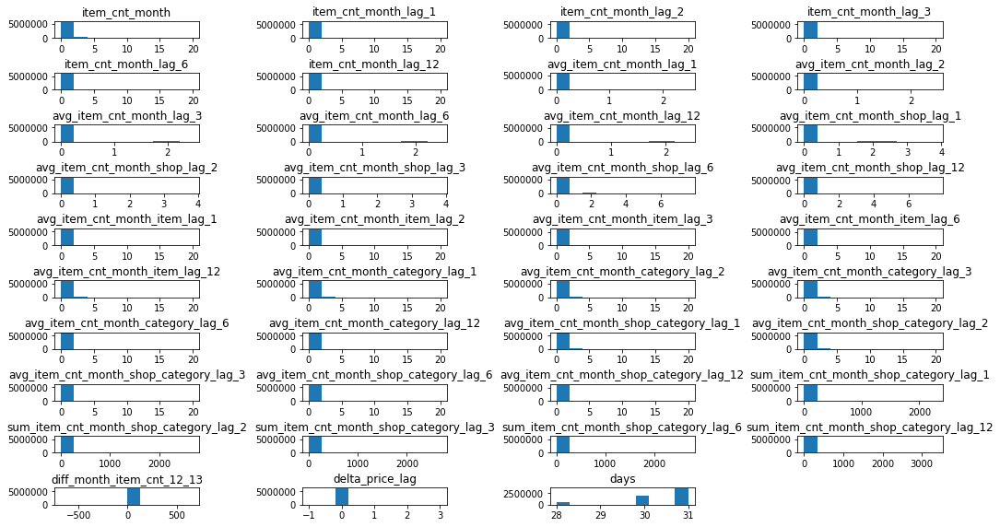

In [190]:
_ = plt.figure(figsize=(15,10))
n=1
for col in sales_data.columns:
    if col in ['date_block_num', 'shop_id', 'item_id', 'item_category_id_y', 'month', 'item_shop_last_sale', 'item_shop_first_sale']:
        continue
    _ = plt.subplot(13, 4, n)
    _ = plt.hist(sales_data[col])
    _ = plt.title(col)
    _ = plt.tight_layout(pad=0.5)
    n+=1 

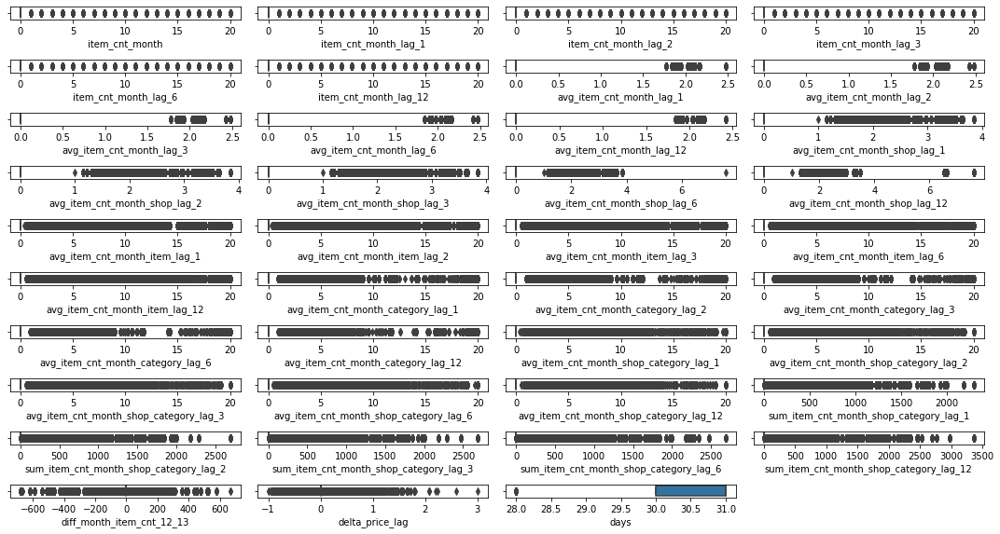

In [191]:
_ = plt.figure(figsize=(15,10))
n=1
for col in sales_data.columns:
    if col in ['date_block_num', 'shop_id', 'item_id', 'item_category_id_y', 'month', 'item_shop_last_sale', 'item_shop_first_sale']:
        continue
    _ = plt.subplot(13, 4, n)
    _ = sns.boxplot(sales_data[col])
    _ = plt.tight_layout()
    n+=1 

Distribution of all features is skewed to the right, which is expected since item_cnt_day and item_price are both skewed to the right and all of the features are generated from those two features.

## Feature selection

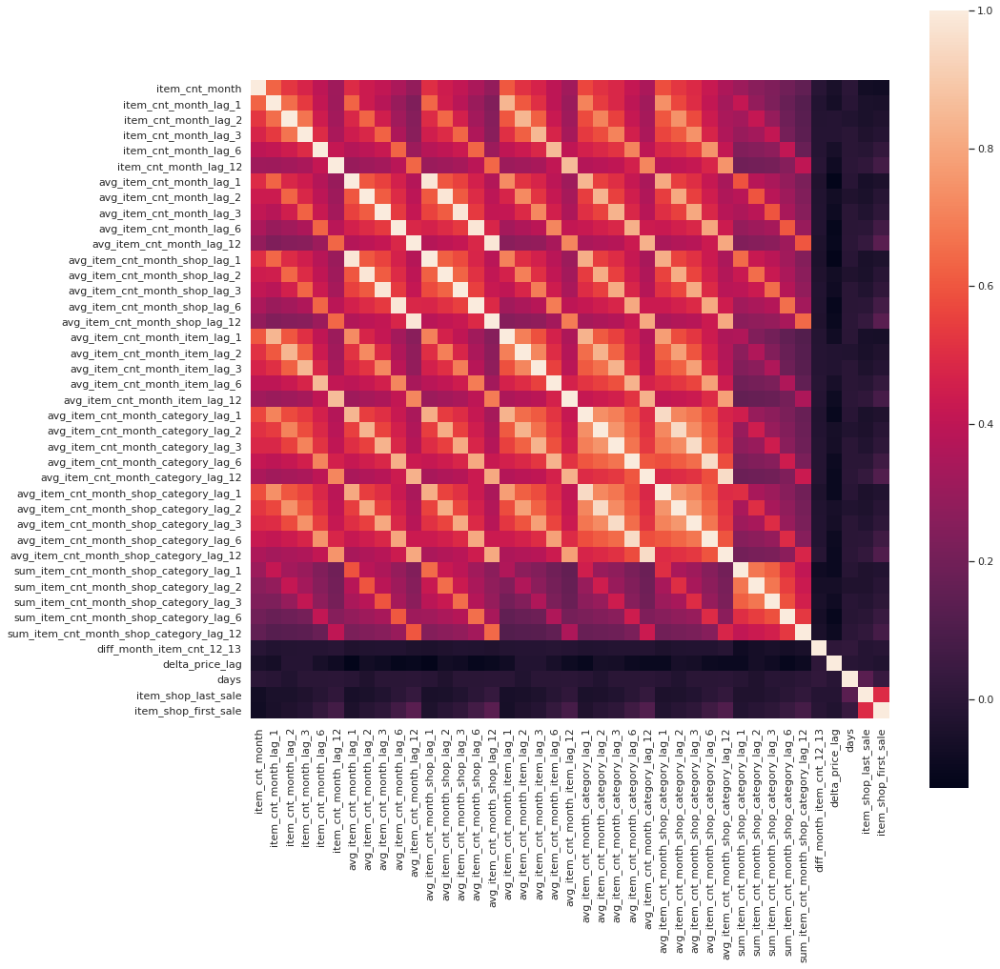

In [192]:
corr =sales_data.drop(['date_block_num', 'shop_id', 'item_id', 'month', 'item_category_id_y'], axis=1)
corr_matrix =corr.corr()
plt.figure(figsize=(15,15))
sns.set(font_scale = 1)
sns.heatmap(corr_matrix, square = True);

In [193]:
cor = []
THRESHOLD=0.90
for i in range(corr_matrix.shape[0]):
    for j in range(i+1, corr_matrix.shape[0]):
        if abs(corr_matrix.iloc[i,j]) >=THRESHOLD:
            cor.append(corr_matrix.columns[j])
            print("Column [" + corr_matrix.columns[i] + "] & Column [" + corr_matrix.columns[j]+"] are highly correlated  <"+str(corr_matrix.iloc[i,j])+">" )

Column [avg_item_cnt_month_lag_1] & Column [avg_item_cnt_month_shop_lag_1] are highly correlated  <0.9825035546189799>
Column [avg_item_cnt_month_lag_2] & Column [avg_item_cnt_month_shop_lag_2] are highly correlated  <0.9827073702188189>
Column [avg_item_cnt_month_lag_3] & Column [avg_item_cnt_month_shop_lag_3] are highly correlated  <0.9833404369816952>
Column [avg_item_cnt_month_lag_6] & Column [avg_item_cnt_month_shop_lag_6] are highly correlated  <0.9845726449935853>
Column [avg_item_cnt_month_lag_12] & Column [avg_item_cnt_month_shop_lag_12] are highly correlated  <0.9843145071227981>
Column [avg_item_cnt_month_category_lag_1] & Column [avg_item_cnt_month_shop_category_lag_1] are highly correlated  <0.9507204654506879>
Column [avg_item_cnt_month_category_lag_2] & Column [avg_item_cnt_month_shop_category_lag_2] are highly correlated  <0.9511635361400819>
Column [avg_item_cnt_month_category_lag_3] & Column [avg_item_cnt_month_shop_category_lag_3] are highly correlated  <0.9525928128

In [194]:
sales_data.drop(['avg_item_cnt_month_shop_lag_1','avg_item_cnt_month_shop_lag_2', 'avg_item_cnt_month_shop_lag_3', 'avg_item_cnt_month_shop_lag_6', 'avg_item_cnt_month_shop_lag_12','avg_item_cnt_month_shop_category_lag_1', 'avg_item_cnt_month_shop_category_lag_2', 'avg_item_cnt_month_shop_category_lag_3', 'avg_item_cnt_month_shop_category_lag_6', 'avg_item_cnt_month_shop_category_lag_12'], axis=1,  inplace=True)

In [195]:
#sales_data.drop(['avg_item_cnt_month_shop_lag_1','avg_item_cnt_month_shop_lag_2', 'avg_item_cnt_month_shop_lag_3', 'avg_item_cnt_month_shop_lag_6', 'avg_item_cnt_month_shop_lag_12','avg_item_cnt_month_shop_category_lag_1', 'avg_item_cnt_month_shop_category_lag_2', 'avg_item_cnt_month_shop_category_lag_3', 'avg_item_cnt_month_shop_category_lag_6', 'avg_item_cnt_month_shop_category_lag_12','avg_item_cnt_month_category_lag_1', 'avg_item_cnt_month_category_lag_2', 'avg_item_cnt_month_category_lag_3', 'avg_item_cnt_month_category_lag_6', 'avg_item_cnt_month_category_lag_12'], axis=1,  inplace=True)

## Encoding

In [196]:
sales_data_encoded =sales_data.copy()

In [197]:
# Ordinal encoder
ordinal_encoder = OrdinalEncoder(categories=[[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33]])

sales_data_encoded['date_block_num'] = ordinal_encoder.fit_transform(sales_data_encoded['date_block_num'].values.reshape(-1,1))

In [198]:
# # Ordinal encoder
ordinal_encoder = OrdinalEncoder(categories=[[1,2,3,4,5,6,7,8,9,10,11,12]])

sales_data_encoded['month'] = ordinal_encoder.fit_transform(sales_data_encoded['month'].values.reshape(-1,1))

In [199]:
# Label encoder
label_encoder = LabelEncoder()
sales_data_encoded['item_id'] = label_encoder.fit_transform(sales_data_encoded['item_id'])

In [200]:
# label_encoder = LabelEncoder()
sales_data_encoded['item_category_id_y'] = label_encoder.fit_transform(sales_data_encoded['item_category_id_y'])

In [201]:
# label_encoder = LabelEncoder()
sales_data_encoded['shop_id'] = label_encoder.fit_transform(sales_data_encoded['shop_id'])

In [202]:
# One-hot encoder
# sales_data_encoded = pd.get_dummies(sales_data_encoded, columns=['shop_id', 'item_category_id'], 
#                               prefix = ['shop_id', 'item_category_id'],
#                               drop_first=True)

In [203]:
sales_data_encoded.to_pickle('sales_data_original.pkl')

## Models

In [3]:
sales_data_encoded = pd.read_pickle('sales_data_original.pkl')

In [4]:
sales_data_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6058523 entries, 2949293 to 10889743
Data columns (total 36 columns):
 #   Column                                   Dtype  
---  ------                                   -----  
 0   shop_id                                  int64  
 1   item_id                                  int64  
 2   date_block_num                           float64
 3   item_cnt_month                           float64
 4   item_cnt_month_lag_1                     float64
 5   item_cnt_month_lag_2                     float64
 6   item_cnt_month_lag_3                     float64
 7   item_cnt_month_lag_6                     float64
 8   item_cnt_month_lag_12                    float64
 9   avg_item_cnt_month_lag_1                 float64
 10  avg_item_cnt_month_lag_2                 float64
 11  avg_item_cnt_month_lag_3                 float64
 12  avg_item_cnt_month_lag_6                 float64
 13  avg_item_cnt_month_lag_12                float64
 14  avg_item_cn

### Split data

In [5]:
target = sales_data_encoded[['date_block_num','item_cnt_month']]
features = sales_data_encoded.drop('item_cnt_month', axis=1)

In [6]:
X_train = features[features['date_block_num']<33]
X_test = features[features['date_block_num']==33]
y_train = target[target['date_block_num']<33].drop('date_block_num', axis=1)
y_test = target[target['date_block_num']==33].drop('date_block_num', axis=1)

In [7]:
data_dmatrix = xgb.DMatrix(data=X_train,label=y_train)

In [8]:
data_dmatrix_test = xgb.DMatrix(data=X_test,label=y_test)

In [ ]:
#xg_reg = xgb.XGBRegressor(learning_rate=0.1, colsample_bytree = 0.7, subsample=0.5, max_depth=8, n_estimators=30)

In [ ]:
# xg_reg = xgb.XGBRegressor(booster= 'gbtree', max_depth=10,
#     n_estimators=1000,
#     min_child_weight=0.5, 
#     colsample_bytree=0.8, 
#     subsample=0.8, 
#     eta=0.3,    
#     seed=42)

In [9]:
xg_reg=xgb.XGBRegressor(booster= 'gbtree',
    max_depth=8,
    n_estimators=1000,
    min_child_weight=300, 
    colsample_bytree=0.8, 
    subsample=0.8, 
    eta=0.3,    
    seed=42)

In [10]:
xg_reg.fit(X_train, 
    y_train, 
    eval_metric="rmse", 
    eval_set=[(X_train, y_train), (X_test, y_test)], 
    verbose=True, 
    early_stopping_rounds = 10)

[23:37:24] WARNING: /home/conda/feedstock_root/build_artifacts/xgboost_1588600955503/work/src/gbm/gbtree.cc:138: Tree method is automatically selected to be 'approx' for faster speed. To use old behavior (exact greedy algorithm on single machine), set tree_method to 'exact'.
[0]	validation_0-rmse:1.02028	validation_1-rmse:1.01669
Multiple eval metrics have been passed: 'validation_1-rmse' will be used for early stopping.

Will train until validation_1-rmse hasn't improved in 10 rounds.
[1]	validation_0-rmse:0.91151	validation_1-rmse:0.93995
[2]	validation_0-rmse:0.85362	validation_1-rmse:0.90356
[3]	validation_0-rmse:0.82565	validation_1-rmse:0.88603
[4]	validation_0-rmse:0.80356	validation_1-rmse:0.87411
[5]	validation_0-rmse:0.78718	validation_1-rmse:0.86981
[6]	validation_0-rmse:0.77837	validation_1-rmse:0.87205
[7]	validation_0-rmse:0.77188	validation_1-rmse:0.87091
[8]	validation_0-rmse:0.76872	validation_1-rmse:0.87148
[9]	validation_0-rmse:0.76460	validation_1-rmse:0.87042
[10]	

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, eta=0.3, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints=None,
             learning_rate=0.300000012, max_delta_step=0, max_depth=8,
             min_child_weight=300, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=0, num_parallel_tree=1,
             objective='reg:squarederror', random_state=42, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, seed=42, subsample=0.8,
             tree_method=None, validate_parameters=False, verbosity=None)

In [11]:
preds_train = xg_reg.predict(X_train)
mae, mse, rmse, r2=error_function(y_train, preds_train)

MAE 0.20265452432921682
MSE 0.5405898777272246
RMSE 0.7352481742427005
R2 0.6174677887492523
VE 0.6174678138988093


In [12]:
preds_test = xg_reg.predict(X_test)
mae, mse, rmse, r2=error_function(y_test, preds_test)

MAE 0.22884278480437367
MSE 0.7356431983674029
RMSE 0.8576964488485439
R2 0.430441699905736
VE 0.4304514348653926


In [13]:
preds_test.sum()

60738.605

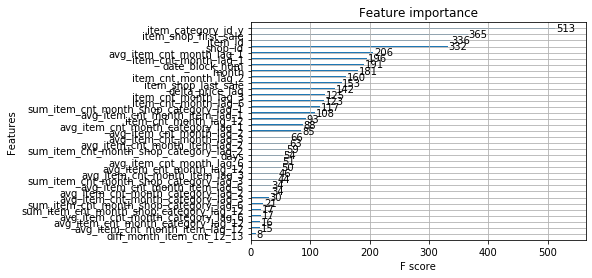

In [14]:
# Plot feature importance
xgb.plot_importance(xg_reg)
plt.rcParams['figure.figsize'] = [15, 25]
plt.show()

In [15]:
real_sales =sales_data_encoded[['date_block_num','shop_id', 'item_id', 'item_category_id_y', 'item_cnt_month']]
real_sales.reset_index(inplace=True)
real_sales

,index,date_block_num,shop_id,item_id,item_category_id_y,item_cnt_month
0,2949293,14.0,53,766,34,1.0
1,2949294,14.0,53,15931,34,2.0
2,2949295,14.0,53,12883,34,1.0
3,2949296,14.0,53,9037,34,1.0
4,2949297,14.0,53,6493,34,1.0
...,...,...,...,...,...,...
6058518,10889739,33.0,49,3740,23,1.0
6058519,10889740,33.0,49,5268,24,1.0
6058520,10889741,33.0,49,9595,33,3.0
6058521,10889742,33.0,49,9593,33,4.0


In [16]:
predicted_sales_october = pd.DataFrame({'item_cnt_month_pred':preds_test})
predicted_sales_october.reset_index(inplace=True)

In [17]:
predicted_sales = pd.DataFrame({'item_cnt_month_pred':preds_train})
predicted_sales.reset_index(inplace=True)

In [18]:
predicted_sales=pd.concat([predicted_sales,predicted_sales_october])
predicted_sales.reset_index(inplace=True)
predicted_sales['item_cnt_month_pred']=predicted_sales['item_cnt_month_pred']
predicted_sales

,level_0,index,item_cnt_month_pred
0,0,0,1.206676
1,1,1,0.024145
2,2,2,1.089135
3,3,3,1.089135
4,4,4,0.024145
...,...,...,...
6058518,238123,238123,3.090289
6058519,238124,238124,1.086398
6058520,238125,238125,1.149215
6058521,238126,238126,3.146288


In [19]:
real_vs_predicted_sales=pd.concat([real_sales, predicted_sales], axis=1)
real_vs_predicted_sales['relative_error'] = ((real_vs_predicted_sales['item_cnt_month'] - real_vs_predicted_sales['item_cnt_month_pred'])/real_vs_predicted_sales['item_cnt_month'])*100
real_vs_predicted_sales.sort_values('item_cnt_month', ascending=False)

,index,date_block_num,shop_id,item_id,item_category_id_y,item_cnt_month,level_0,index,item_cnt_month_pred,relative_error
1946702,5271171,30.0,26,3056,37,20.0,1946702,1946702,13.131771,34.341145
1458185,4407478,20.0,41,13140,73,20.0,1458185,1458185,11.852498,40.737510
4770080,9601301,13.0,37,4346,32,20.0,4770080,4770080,15.678765,21.606174
4643703,9474924,13.0,29,5232,17,20.0,4643703,4643703,3.465608,82.671959
4298075,9129296,32.0,11,3501,27,20.0,4298075,4298075,4.990519,75.047405
...,...,...,...,...,...,...,...,...,...,...
2555746,5880215,23.0,12,15214,66,0.0,2555746,2555746,0.087800,-inf
2555745,5880214,23.0,12,15445,66,0.0,2555745,2555745,0.062907,-inf
2555744,5880213,23.0,12,15370,66,0.0,2555744,2555744,0.058480,-inf
2555743,5880212,23.0,12,15477,66,0.0,2555743,2555743,0.044335,-inf


In [20]:
real_vs_predicted_sales[real_vs_predicted_sales['date_block_num']==33][['item_cnt_month', 'item_cnt_month_pred']].duplicated().sum()

208190

In [21]:
real_vs_predicted_sales[real_vs_predicted_sales['date_block_num']==33].shape

(238128, 10)

In [22]:
real_vs_predicted_sales.replace([np.inf, -np.inf], np.nan, inplace=True)

In [23]:
real_vs_predicted_sales['relative_error'].value_counts()

 97.258478    739
 97.476539    738
 97.460032    629
 96.846080    619
 97.678092    453
             ... 
-73.100138      1
-73.099422      1
-73.099136      1
-73.098934      1
 2.000028       1
Name: relative_error, Length: 637244, dtype: int64

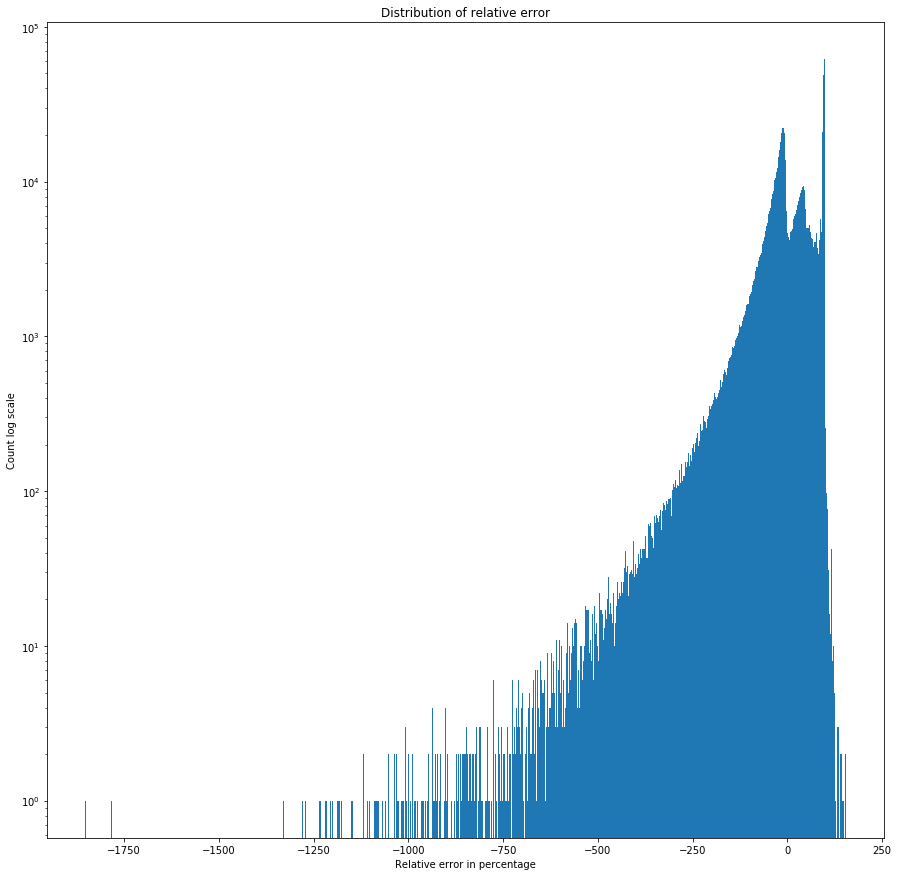

In [24]:
_ = plt.figure(figsize=(15,15))
_ = plt.hist(real_vs_predicted_sales['relative_error'], bins=1000)
_ = plt.yscale('log')
_ = plt.xlabel('Relative error in percentage')
_ = plt.ylabel('Count log scale')
_ = plt.title('Distribution of relative error')

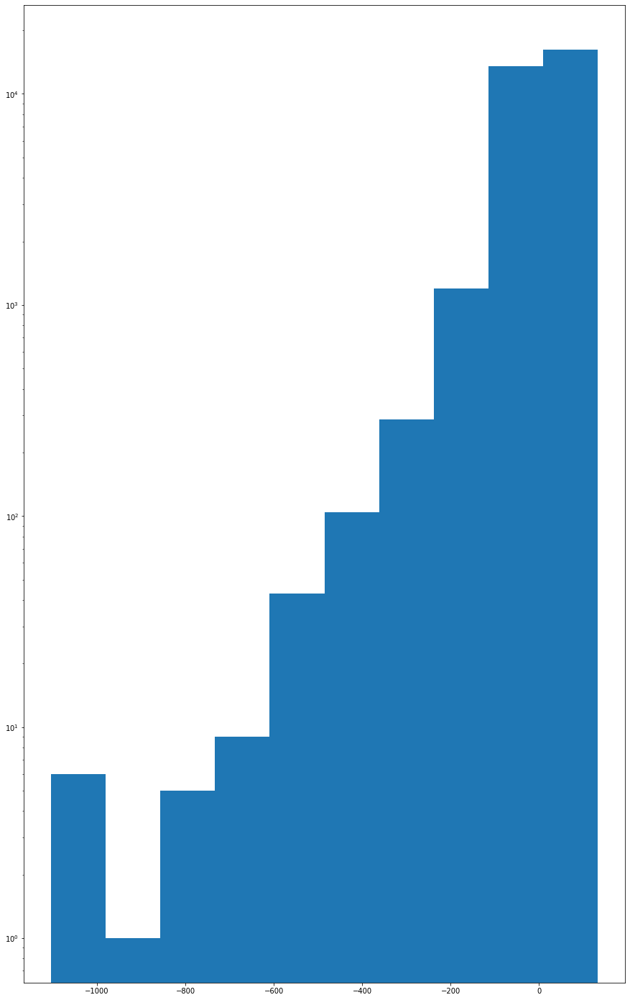

In [25]:
_ = plt.hist(real_vs_predicted_sales[real_vs_predicted_sales['date_block_num']==33]['relative_error'])
_ = plt.yscale('log')

In [26]:
real_vs_predicted_sales[real_vs_predicted_sales['date_block_num']==33].shape

(238128, 10)

In [ ]:
# fig = px.scatter(real_vs_predicted_sales, x='item_id', y='relative_error', hover_data=['item_id'], title='Relative error in percentage for October 2015')
# fig.show()

In [27]:
shop_category = real_vs_predicted_sales.groupby(['shop_id', 'item_category_id_y']).sum()[['item_cnt_month', 'item_cnt_month_pred']].reset_index()
shop_category['relative_error']=((shop_category['item_cnt_month']-shop_category['item_cnt_month_pred'])/shop_category['item_cnt_month'])*100
shop_category.sort_values('relative_error', ascending=False)

,shop_id,item_category_id_y,item_cnt_month,item_cnt_month_pred,relative_error
2168,28,28,0.0,-180.753738,inf
2657,34,72,0.0,-32.952637,inf
2732,35,70,0.0,-6.722719,inf
1497,19,48,0.0,-0.059374,inf
2710,35,48,0.0,-0.209081,inf
...,...,...,...,...,...
933,12,15,0.0,0.433704,-inf
3255,42,54,0.0,1.015436,-inf
1730,22,47,0.0,0.624252,-inf
3250,42,49,0.0,25.673071,-inf


In [28]:
fig = px.scatter(shop_category, x='shop_id', y='relative_error', color='item_category_id_y', hover_data=['shop_id'], title='Relative error in percentage per shop-category')
fig.show()

In [29]:
shop_item = real_vs_predicted_sales.groupby(['shop_id']).sum()[['item_cnt_month', 'item_cnt_month_pred']].reset_index()
shop_item['relative_error']=((shop_item['item_cnt_month']-shop_item['item_cnt_month_pred'])/shop_item['item_cnt_month'])*100
shop_item

,shop_id,item_cnt_month,item_cnt_month_pred,relative_error
0,0,18408.0,18942.453125,-2.903374
1,1,16468.0,17878.361328,-8.564254
2,2,21520.0,21806.955078,-1.333434
3,3,24886.0,25095.044922,-0.840010
4,4,45885.0,42374.074219,7.651576
5,5,33901.0,33553.980469,1.023626
6,6,6609.0,4226.307617,36.052238
7,7,12467.0,16277.842773,-30.567440
8,8,28006.0,25326.771484,9.566623
9,9,4977.0,5970.093750,-19.953662


In [30]:
fig = px.scatter(shop_item, x='shop_id', y='relative_error', color='shop_id', hover_data=['shop_id'], title='Relative error in percentage per shop')
fig.show()

In [31]:
# Shop_id 30
sales_data_encoded[sales_data_encoded['shop_id']==30]['date_block_num'].unique()

array([33.])

Shop_id 30 is a new store and appears in the October.

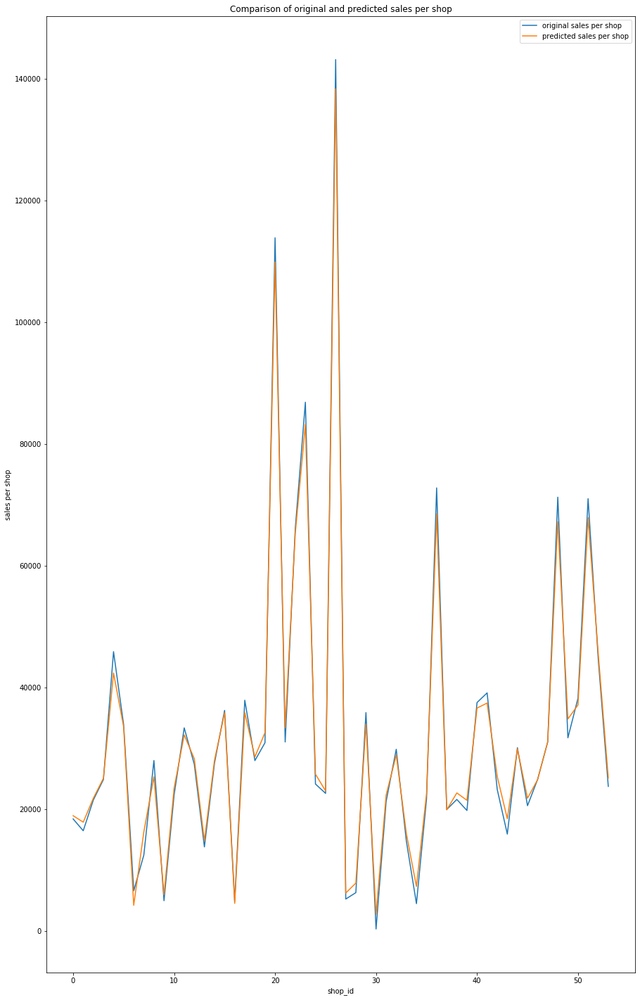

In [32]:
_ = plt.plot(real_vs_predicted_sales.groupby('shop_id').sum()['item_cnt_month'], label='original sales per shop')
_ = plt.plot(real_vs_predicted_sales.groupby('shop_id').sum()['item_cnt_month_pred'], label='predicted sales per shop')
_ = plt.legend()
_ = plt.xlabel('shop_id')
_ = plt.ylabel('sales per shop')
_ = plt.title('Comparison of original and predicted sales per shop')

In [33]:
original_sales =real_vs_predicted_sales.groupby('date_block_num').sum()[['item_cnt_month', 'item_cnt_month_pred']].reset_index()

In [34]:
original_sales

,date_block_num,item_cnt_month,item_cnt_month_pred
0,13.0,100878.0,102809.375000
1,14.0,102854.0,100885.539062
2,15.0,84816.0,83763.960938
3,16.0,88057.0,86545.312500
4,17.0,89515.0,91466.914062
5,18.0,84196.0,83616.078125
6,19.0,94272.0,96056.507812
7,20.0,82661.0,80802.218750
8,21.0,92327.0,93329.960938
9,22.0,98404.0,101031.484375


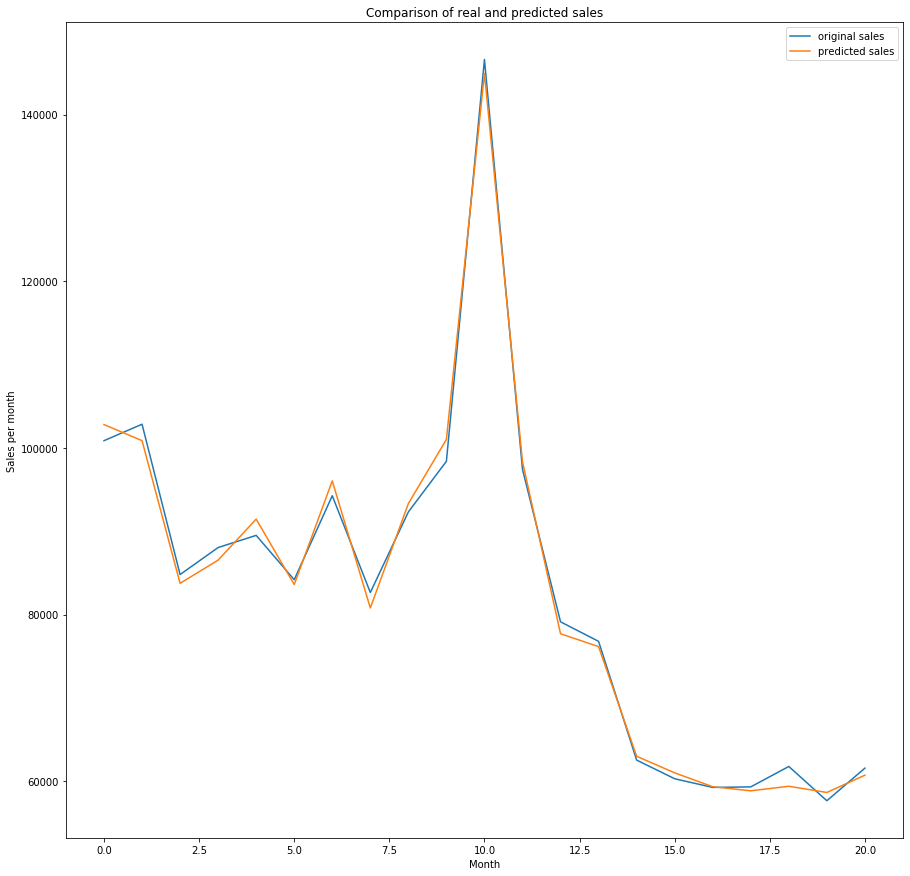

In [35]:
_ = plt.figure(figsize=(15,15))
_ = plt.plot(original_sales['item_cnt_month'], label='original sales')
_ = plt.plot(original_sales['item_cnt_month_pred'], label ='predicted sales')
#_ = plt.yscale('log')
_ = plt.xlabel('Month')
_ = plt.ylabel('Sales per month')
_ = plt.title('Comparison of real and predicted sales')
_ = plt.legend()